## Импорт библиотек

In [22]:
from collections import Counter
from operator import itemgetter
from nltk import ngrams
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

import pymorphy2
import itertools
import spacy
import nltk
import re
import ast

In [ ]:
nltk.download('punkt_tab')

In [2]:
nlp = spacy.load("ru_core_news_sm")

## Чтение данных
Читаем вариант с текстами, чтобы по ним можно было добавить текстовые признаки

In [3]:
df = pd.read_csv("meta_table_with_texts.csv", index_col=0)
df.head()

,author,title,year,annotation,genres,text
0,Пушкин Александр Сергеевич,"""Сраженный рыцарь"". Пушкина",1875,NaN,"['Стихотворение', 'Поэзия', 'Дополнительные ма...","\n \nЛитературный альбомъ.\n""Сраженный рыцар..."
1,Карамзин Николай Михайлович,О достоинстве древних и новых,1802,NaN,"['Очерк', 'Переводы', 'Публицистика', 'Переводы']",\nО достоинстве древних и новых\n(Перевод с не...
2,Гоголь Николай Васильевич,Переписка (1848-1852),1852,Пропущено два разворота.,"['Переписка', 'Эпистолярий', 'Переписка']",\n Гоголь Н. В. Полное собрание сочинений и ...
3,Мамин-Сибиряк Дмитрий Наркисович,Злой дух,1898,NaN,"['Рассказ', 'Проза', 'Повести и рассказы разны...",\n \nД. МАМИНЪ-СИБИРЯКЪПОЛНОЕ СОБРАНІЕ СОЧИН...
4,Мамин-Сибиряк Дмитрий Наркисович,Нимфа,1908,NaN,"['Рассказ', 'Проза', 'Повести и рассказы разны...",\nДмитрий Мамин-Сибиряк\nНимфа\nI.\n Щегольс...


In [4]:
print(f"Количество столбцов - {df.shape[1]}, количество строк - {df.shape[0]}")

Количество столбцов - 6, количество строк - 2565


## 1. Первичная предобработка текста

В данном разделе необходимо выполнить следующие пункты:
- Оценить и обработать пропуски, дубликаты. Очистить текст от шумовых данных
- Преобразовать регистр, исключить стоп-слова, провести токенизацию, лемматизацию и стемминг

Алгоритм:
1. Убрать спец.символы
2. Удаление из текстов упоминаний авторов и названий произведений (это в следующих пунктах при разбиении на слова и прочее)
3. Убираем стоп-слова

In [5]:
# Убираем все символы, кроме букв, цифр и знаков пунктуации и препинания, убираем лишние пробелы
def clean_df(x):
    v2 = re.sub(r'[^А-Яа-я0-9\(\).,!?: ]' , '', x.lower())
    result = re.sub(r'\s+', ' ', v2)
    return result

In [6]:
df["text_new"] = df["text"].apply(clean_df)

In [7]:
# Убираем стоп-слова - итог: список
def delete_stop_words(x):
    tokens = word_tokenize(x)
    stop_words = set(stopwords.words('russian'))
    filtered_tokens = [word for word in tokens if word not in stop_words]
    return filtered_tokens

In [8]:
df["text_new_without_stop"] = df["text_new"].apply(delete_stop_words)

In [9]:
# Создаем отдельную колонку для текста без стоп слов (формат строки, а не списка)
def join_list(x):
    return (' '.join(x))
df["text_new_without_stop_"] = df["text_new_without_stop"].apply(join_list)

In [10]:
df

,author,title,year,annotation,genres,text,text_new,text_new_without_stop,text_new_without_stop_
0,Пушкин Александр Сергеевич,"""Сраженный рыцарь"". Пушкина",1875,NaN,"['Стихотворение', 'Поэзия', 'Дополнительные ма...","\n \nЛитературный альбомъ.\n""Сраженный рыцар...",литературный альбомъ.сраженный рыцарь. пушкин...,"[литературный, альбомъ.сраженный, рыцарь, ., п...",литературный альбомъ.сраженный рыцарь . пушкин...
1,Карамзин Николай Михайлович,О достоинстве древних и новых,1802,NaN,"['Очерк', 'Переводы', 'Публицистика', 'Переводы']",\nО достоинстве древних и новых\n(Перевод с не...,о достоинстве древних и новых(перевод с немецк...,"[достоинстве, древних, новых, (, перевод, неме...",достоинстве древних новых ( перевод немецкого ...
2,Гоголь Николай Васильевич,Переписка (1848-1852),1852,Пропущено два разворота.,"['Переписка', 'Эпистолярий', 'Переписка']",\n Гоголь Н. В. Полное собрание сочинений и ...,гоголь н. в. полное собрание сочинений и писе...,"[гоголь, н., в., полное, собрание, сочинений, ...",гоголь н. в. полное собрание сочинений писем :...
3,Мамин-Сибиряк Дмитрий Наркисович,Злой дух,1898,NaN,"['Рассказ', 'Проза', 'Повести и рассказы разны...",\n \nД. МАМИНЪ-СИБИРЯКЪПОЛНОЕ СОБРАНІЕ СОЧИН...,д. маминъсибирякъполное собране сочиненйтомъ ...,"[д., маминъсибирякъполное, собране, сочиненйто...",д. маминъсибирякъполное собране сочиненйтомъ в...
4,Мамин-Сибиряк Дмитрий Наркисович,Нимфа,1908,NaN,"['Рассказ', 'Проза', 'Повести и рассказы разны...",\nДмитрий Мамин-Сибиряк\nНимфа\nI.\n Щегольс...,дмитрий маминсибирякнимфа. щегольской волжский...,"[дмитрий, маминсибирякнимфа, ., щегольской, во...",дмитрий маминсибирякнимфа . щегольской волжски...
...,...,...,...,...,...,...,...,...,...
2560,Достоевский Федор Михайлович,Историко-критический комментарий к сочинениям ...,1885,NaN,"['Статья', 'Критика', 'О творчестве автора']",\n Историко-критическій комментарій къ сочин...,историкокритическй комментарй къ сочиненямъ ....,"[историкокритическй, комментарй, къ, сочиненям...",историкокритическй комментарй къ сочиненямъ . ...
2561,Куприн Александр Иванович,Звезда Соломона,1917,NaN,"['Повесть', 'Проза', 'Повести и романы']",\nАлександр Иванович Куприн Звезда Соломона\nI...,александр иванович куприн звезда соломона стра...,"[александр, иванович, куприн, звезда, соломона...",александр иванович куприн звезда соломона стра...
2562,Бунин Иван Алексеевич,На край света,1894,NaN,"['Рассказ', 'Проза', 'Рассказы (1892-1909)']",\n Иван Алексеевич Бунин\nНА КРАЙ СВЕТА\n ...,иван алексеевич бунинна край света оригинал з...,"[иван, алексеевич, бунинна, край, света, ориги...",иван алексеевич бунинна край света оригинал : ...
2563,Салтыков-Щедрин Михаил Евграфович,Внучка панцирного боярина,1868,Роман из времен последнего польского мятежа И....,"['Статья', 'Критика', 'Критика, публицистика, ...",\nМ.Е. Салтыков-Щедрин\nВнучка панцирного бояр...,м.е. салтыковщедринвнучка панцирного боярина. ...,"[м.е, ., салтыковщедринвнучка, панцирного, боя...",м.е . салтыковщедринвнучка панцирного боярина ...


## 2. Анализ текстов

В данном разделе необходимо выполнить следующие пункты:
- Расчет средней, минимальной, максимальной длины текстов (в нашем случае рассматриваются символы и слова отдельно)
- Визуализация распределения метрик по авторам
- Частотный анализ слов, биграмм и триграмм
- Распределение частей речи

>Как итог - получается датафрейм с текстовыми признаками

### 2.1. Нахождение статистик в группировке по авторам (min, max, mean)

In [11]:
df_with_stat = df.copy().drop(["year", "annotation", "genres", "text", "text_new", "text_new_without_stop", "text_new_without_stop_"], axis=1)

In [12]:
# Количество символов в колонку 'len_text_symb'
df_with_stat["len_text_symb"] = df["text_new"].apply(len)

# Количество слов в колонку 'len_text_word'
df_with_stat["len_text_word"] = df["text_new"].apply(lambda x: len(x.split()))

Далее расчитаем минимальные, средние и максимальные длины текстов для каждого автора:

In [13]:
# По символам
sum_stats_symb = df_with_stat.groupby('author')['len_text_symb'].agg(['mean', 'min', 'max']).reset_index()
sum_stats_symb

,author,mean,min,max
0,Блок Александр Александрович,46293.932203,683,1340765
1,Бунин Иван Алексеевич,43428.480687,355,1601523
2,Гоголь Николай Васильевич,121309.121693,417,1477691
3,Достоевский Федор Михайлович,205506.210000,473,2501348
4,Есенин Сергей Александрович,61802.514706,467,1162706
5,Карамзин Николай Михайлович,31361.682927,218,980924
6,Куприн Александр Иванович,21982.107692,486,581455
7,Лермонтов Михаил Юрьевич,37343.567568,507,262627
8,Мамин-Сибиряк Дмитрий Наркисович,62576.781250,1646,599292
9,Пушкин Александр Сергеевич,53150.526718,338,1162969


In [14]:
# По словам
sum_stats_word = df_with_stat.groupby('author')['len_text_word'].agg(['mean', 'min', 'max']).reset_index()
sum_stats_word

,author,mean,min,max
0,Блок Александр Александрович,6951.906780,101,197550
1,Бунин Иван Алексеевич,6873.188841,47,262545
2,Гоголь Николай Васильевич,19117.513228,60,239396
3,Достоевский Федор Михайлович,32277.955000,61,381811
4,Есенин Сергей Александрович,9540.470588,70,177936
5,Карамзин Николай Михайлович,4644.048780,31,151019
6,Куприн Александр Иванович,3313.043590,76,89140
7,Лермонтов Михаил Юрьевич,5766.783784,69,42239
8,Мамин-Сибиряк Дмитрий Наркисович,9355.449219,229,87677
9,Пушкин Александр Сергеевич,8168.229008,43,178151


### 2.2. Визуализация распределений

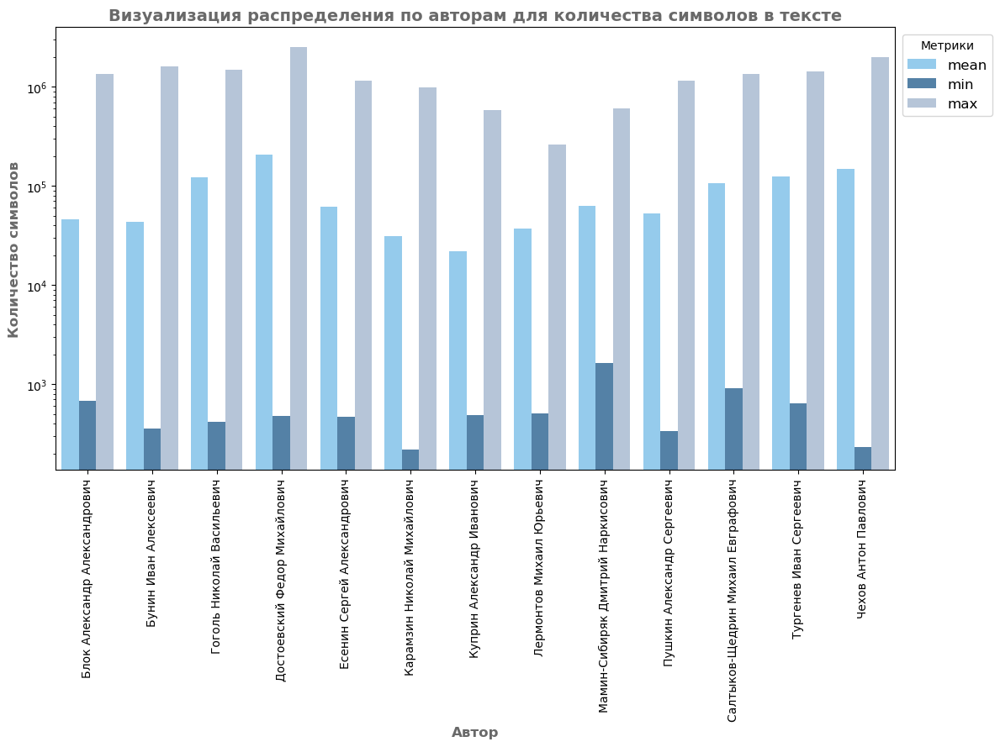

In [57]:
# Создание графика визуализации распределения по авторам для метрик количества символов в тексте
plt.figure(figsize=(12, 9))

custom_colors = ["#87cefa", "#4682b4", "#b0c4de"]

sns.barplot(data=sum_stats_symb.melt(id_vars='author'), x='author', y='value', hue='variable', palette=custom_colors)
plt.yscale('log') # логарифмическая шкала
plt.title('Визуализация распределения по авторам для количества символов в тексте', fontsize=14, fontweight="bold", color="dimgray")
plt.xlabel('Автор', fontsize=12, fontweight="bold", color="dimgray")
plt.ylabel('Количество символов', fontsize=12, fontweight="bold", color="dimgray")
plt.xticks(rotation=90)
plt.legend(title='Метрики', bbox_to_anchor=(1,1), fontsize=12)
plt.tight_layout()
plt.show()

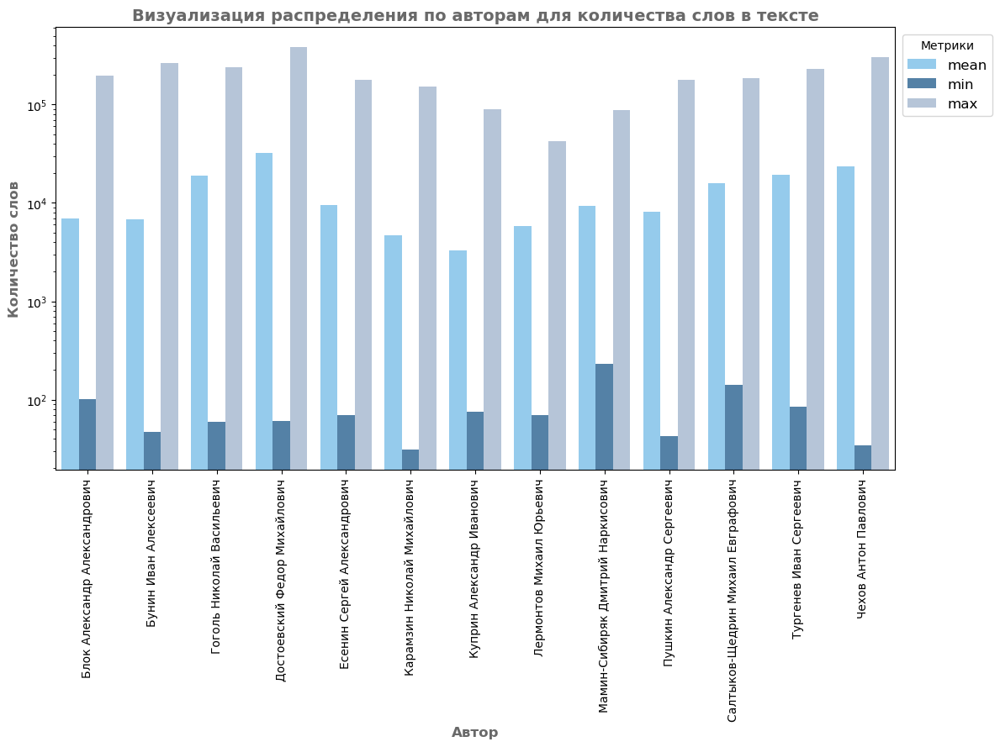

In [58]:
# Создание графика визуализации распределения по авторам для метрик количества слов в тексте
plt.figure(figsize=(12, 9))

custom_colors = ["#87cefa", "#4682b4", "#b0c4de"]

sns.barplot(data=sum_stats_word.melt(id_vars='author'), x='author', y='value', hue='variable', palette=custom_colors)
plt.yscale('log') # логарифмическая шкала
plt.title('Визуализация распределения по авторам для количества слов в тексте', fontsize=14, fontweight="bold", color="dimgray")
plt.xlabel('Автор', fontsize=12, fontweight="bold", color="dimgray")
plt.ylabel('Количество слов', fontsize=12, fontweight="bold", color="dimgray")
plt.xticks(rotation=90)
plt.legend(title='Метрики', bbox_to_anchor=(1,1), fontsize=12)
plt.tight_layout()
plt.show()

> По графикам можно видеть, что у всех авторов распределение в количестве символов и слов в текстах приблизительно совпадают (разница между количеством символов и слов по значениям разняться, что логично, однако мы наблюдаем и там и там практически идентичную картину распределения). Если смотреть на количественные метрики слов/символов, то хоть на графике это слабо можно увидеть, но разница между средними значениями, например, может сильно разниться между разными авторами. Так, у Достоевского можем наблюдать самую высокую планку mean в количестве слов/символов, в то время, как, например, у Куприна этот же средний показатель меньше всех, однако это не говорит о том, что автор пишет меньше, чем остальные, так как есть еще показатель min, который показал, что меньше всех слов/символов использовал хотя бы в одном тексте - Карамзин (недалеко от него также расположился и Чехов). В целом, данный показатель можно попробовать учесть при попытке определять авторство текста

### 2.3. Частотный анализ (слова, биграммы и триграммы)
Для начала займемся леммитизацией слов, для того, чтобы в дальнейшем правильно посчитать слова в тексте (они будут приведены к своей нормальной форме):

In [21]:
morph = pymorphy2.MorphAnalyzer()

# Функция леммитизации слов
def lemm_fubc(x):
    lemmatized_words = []
    for word in x:
        # Удаляем все другие знаки, кроме букв и цифр
        cleaned_word = re.sub(r'[^А-ЯA-Zа-яa-zёЁ0-9]', '', word)
        lemmatized_words.append(morph.parse(cleaned_word)[0].normal_form)
    print(1)
    return lemmatized_words

df['lemm'] = df['text_new_without_stop'].apply(lemm_fubc)

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


In [24]:
df.to_csv("df_text_full.csv")

Для корректного подчета слов/биграмм/триграмм необходимо, чтобы в подсчете не участвовали ФИО авторов. 

#### Слова

In [25]:
author_list = list(itertools.chain(*[author.split() for author in df.author.str.lower().unique()]))

# Вопрос в том, необходимо ли нам чистить слова меньше 2? (пока не удалять)
def remove_author_names(lemmatized_words):
    return [ word for word in lemmatized_words if word not in author_list and len(word) > 2
             and not re.fullmatch(r'\d+|[^A-Za-zА-Яа-яЁё]+', word)]

df['lemm_without_authors'] = df['lemm'].apply(remove_author_names)

In [26]:
df_with_stat['word_counts'] = df['lemm_without_authors'].apply(lambda x: dict(sorted(Counter(x).items(), key=lambda item: item[1], reverse=True)))

In [27]:
# Функция для объединения словарей Counter по авторам
def combine_word_counts(df, counter_column):
    combined_counts = {}
    
    for _, row in df.iterrows():
        author = row['author']
        counts = row[counter_column]
        
        if author not in combined_counts:
            combined_counts[author] = Counter()

        combined_counts[author] += counts
    
    return combined_counts

In [29]:
# Объединяем словарь частот слов для каждого автора
word_counts_per_author = combine_word_counts(df_with_stat, 'word_counts')

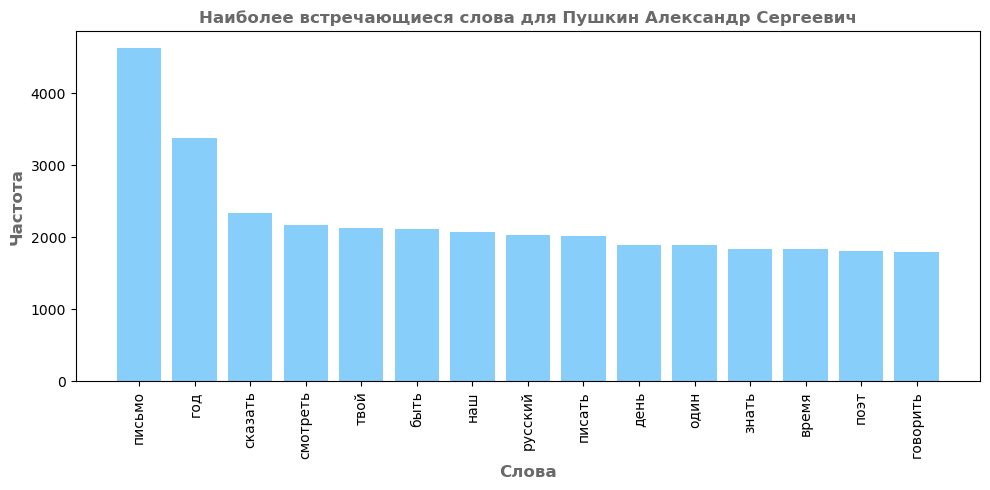

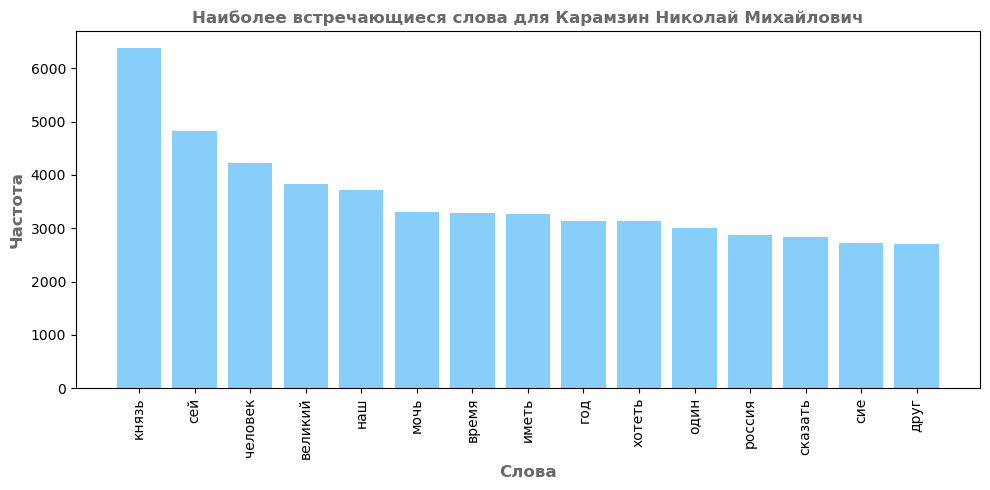

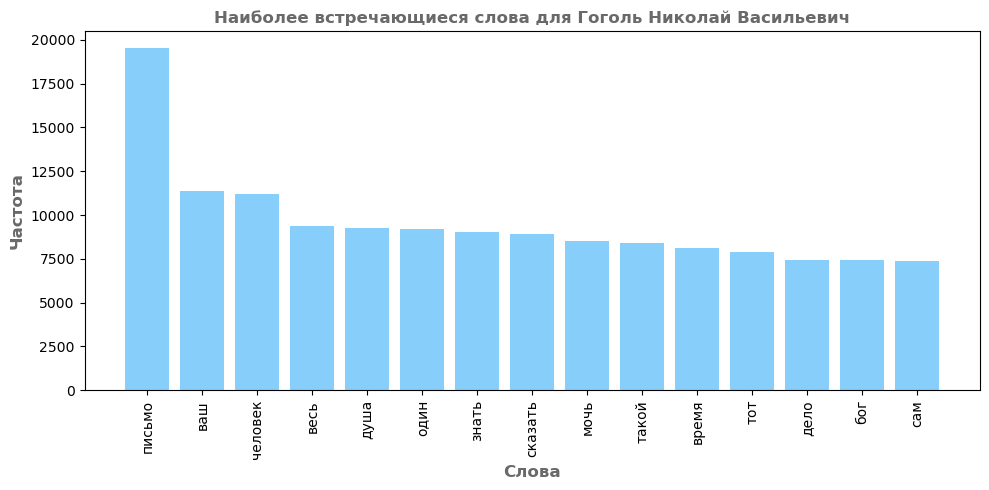

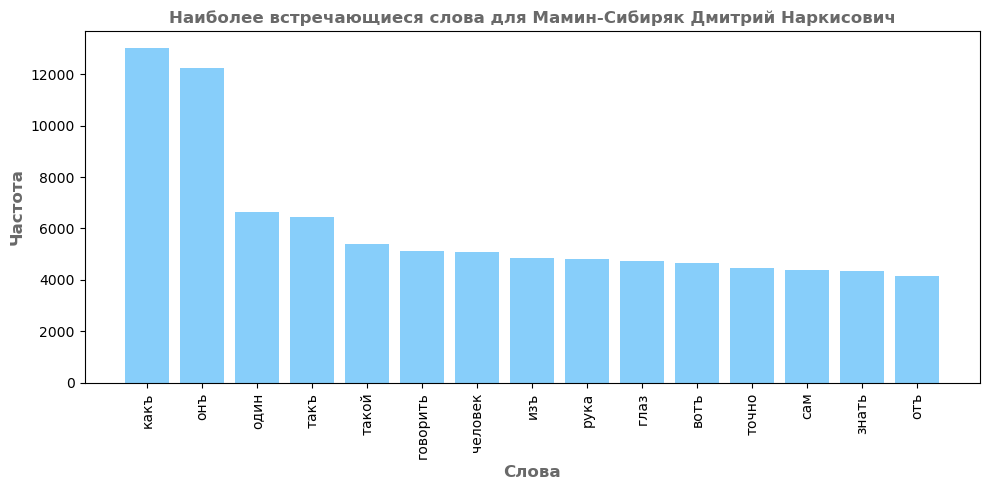

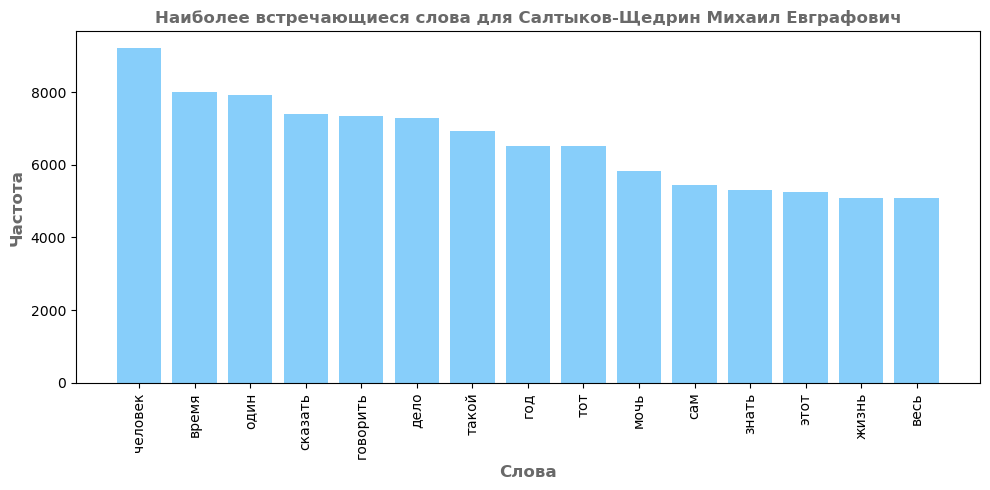

...

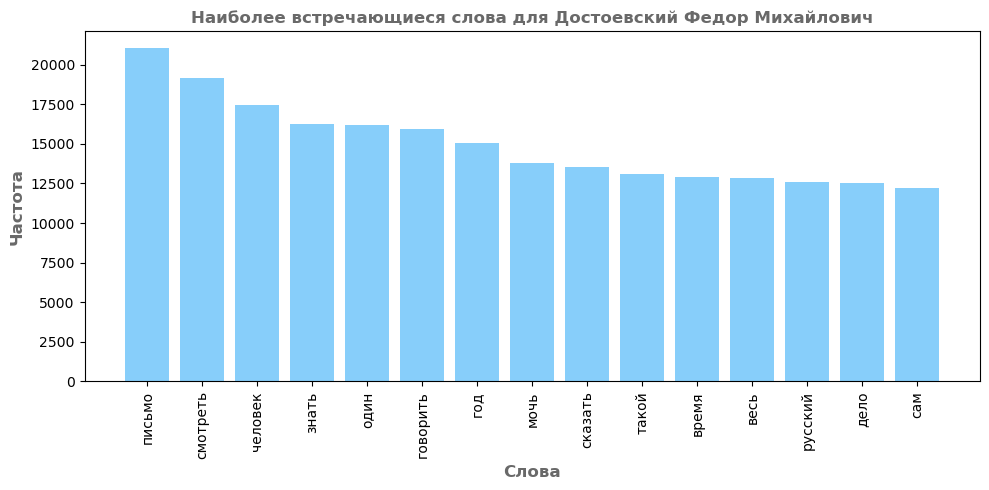

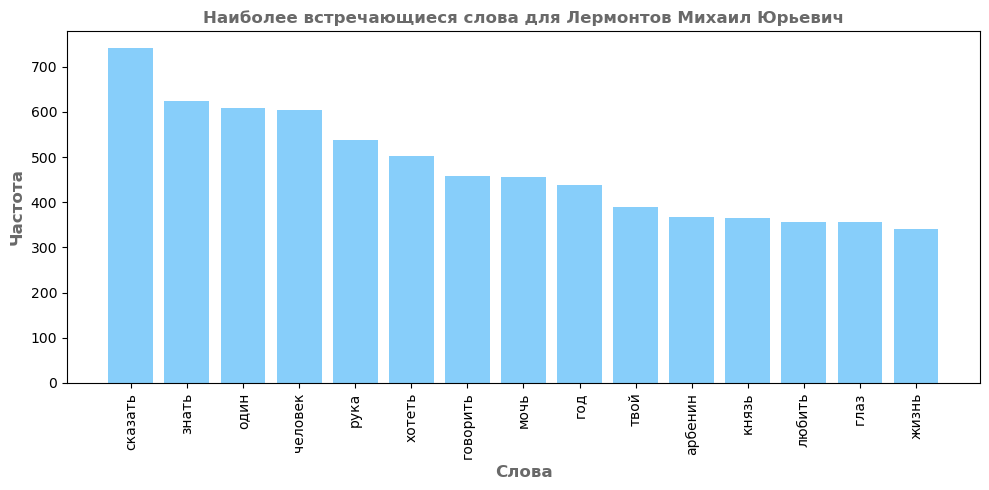

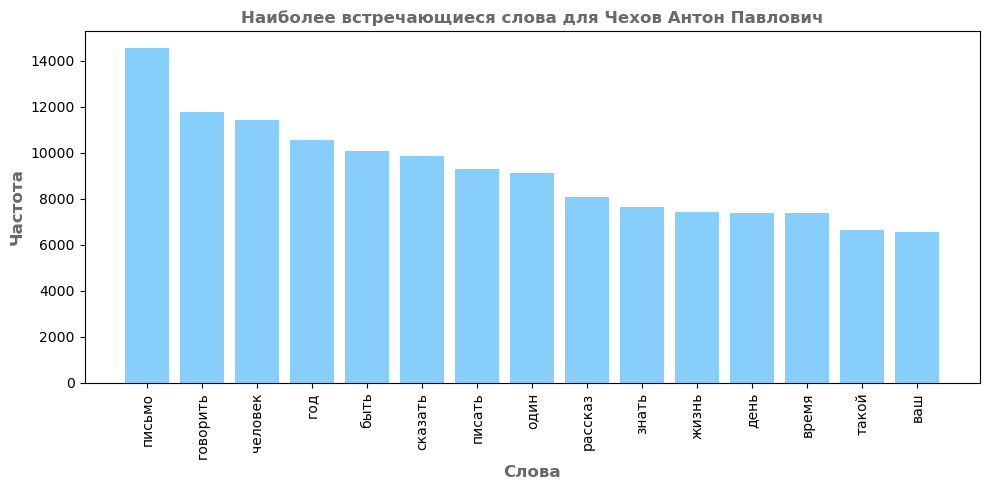

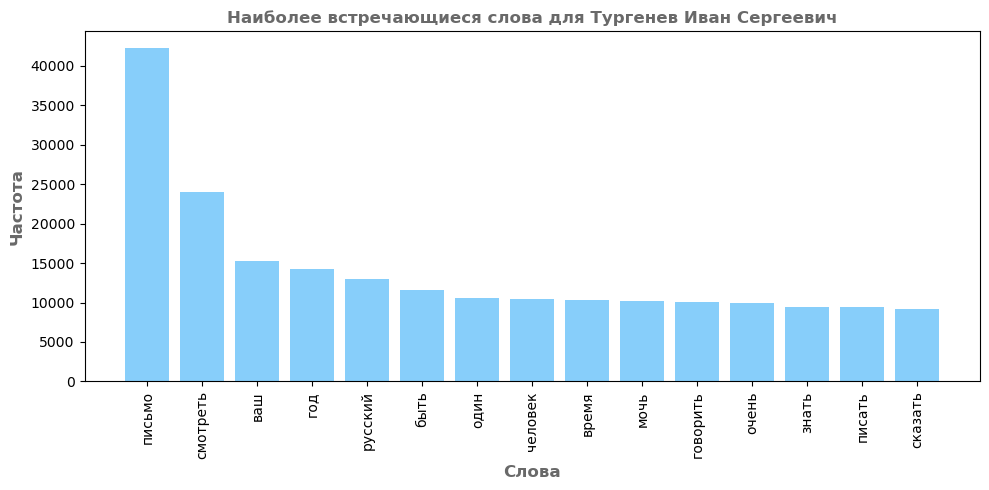

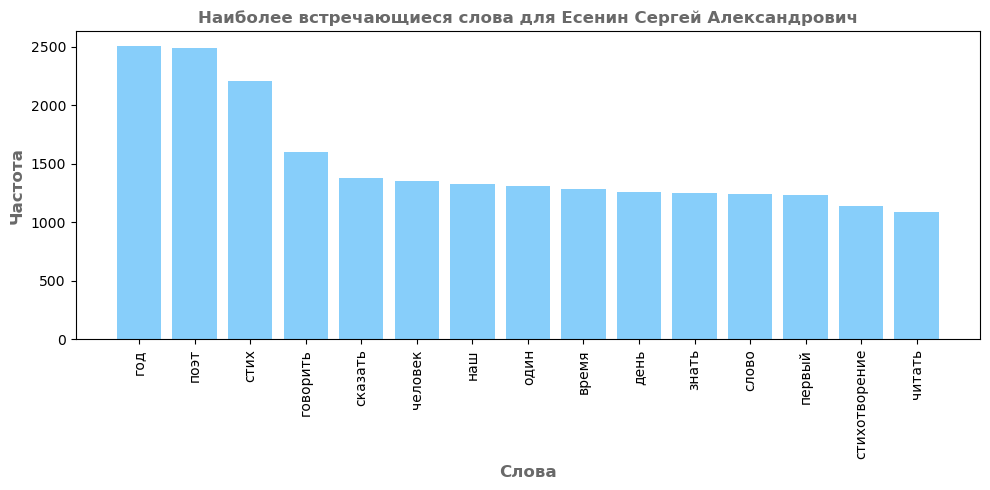

In [36]:
# Список стоп-слов
stop_words = {'свой', 'это', 'который', 'так', 'мой', 'стр', 'и', 'в', 'на', 'по', 'не', 'из', 'что', 'к', 'для', 'все', 'как', 'но'}

def plot_most_common_words(word_counts_dict, n):
    for author, counts in word_counts_dict.items():
        filtered_counts = {word: count for word, count in counts.items() if word not in stop_words}
        
        most_common = Counter(filtered_counts).most_common(n)
        
        if most_common:
            words, count_values = zip(*most_common)

            plt.figure(figsize=(10, 5))
            plt.bar(words, count_values, color='#87cefa')
            plt.title(f'Наиболее встречающиеся слова для {author}', fontsize=12, fontweight="bold", color="dimgray")
            plt.xlabel('Слова', fontsize=12, fontweight="bold", color="dimgray")
            plt.ylabel('Частота', fontsize=12, fontweight="bold", color="dimgray")
            plt.xticks(rotation=90)
            plt.tight_layout()
            plt.show()

plot_most_common_words(word_counts_per_author, n=15)

Разбиваем наши слова на биграммы и триграммы

#### Биграммы и триграммы

In [46]:
df['bigrams'] = df['lemm_without_authors'].apply(lambda x: list(ngrams(x, 2)))
df['trigrams'] = df['lemm_without_authors'].apply(lambda x: list(ngrams(x, 3)))

In [47]:
def word_analys(lst):
    word_freq = dict(Counter(lst))
    sorted_word = dict(sorted(word_freq.items(), key=lambda item: item[1], reverse=True))
    return sorted_word

In [49]:
# Объединяем словарь частот для каждого автора
bigrams_counts_per_author = combine_word_counts(df_with_stat, 'bigrams_counter')

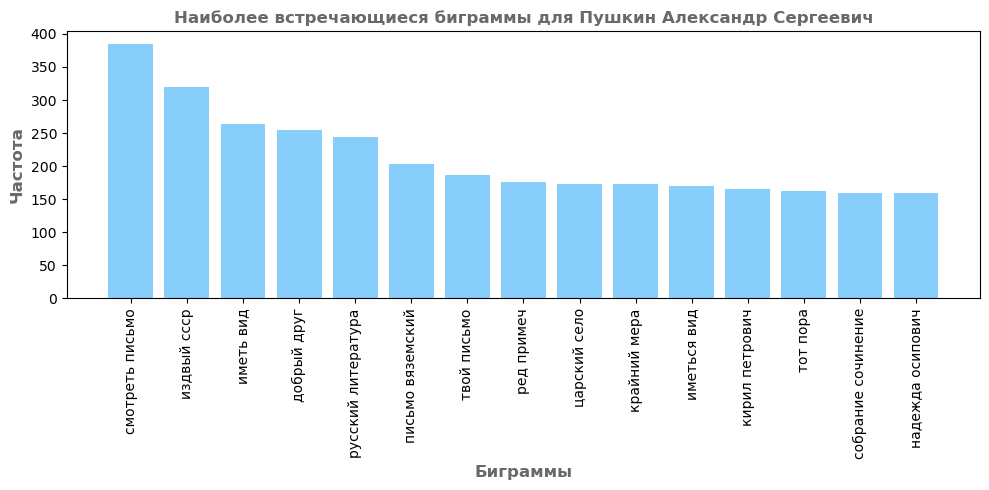

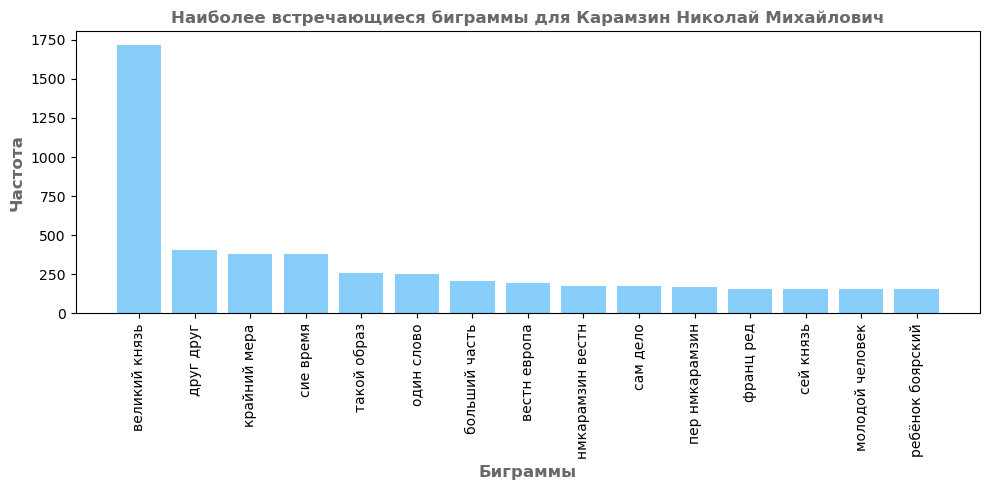

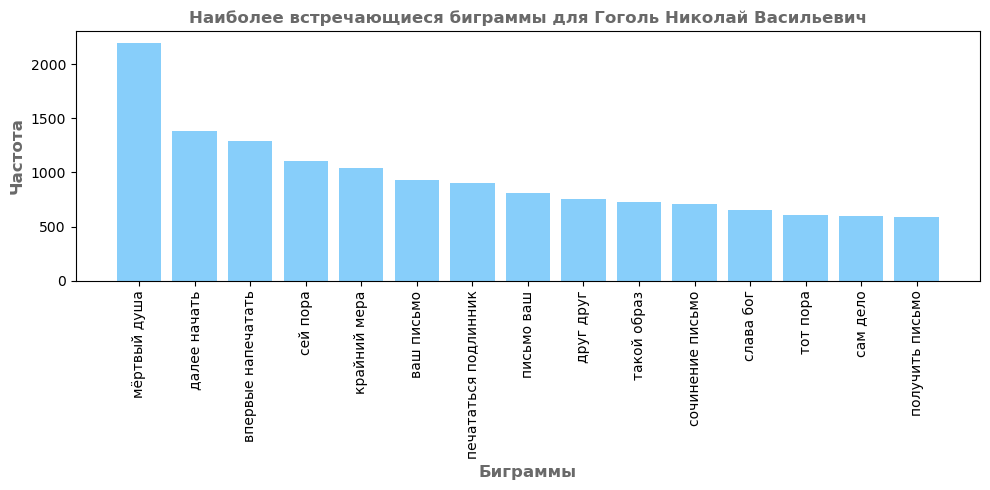

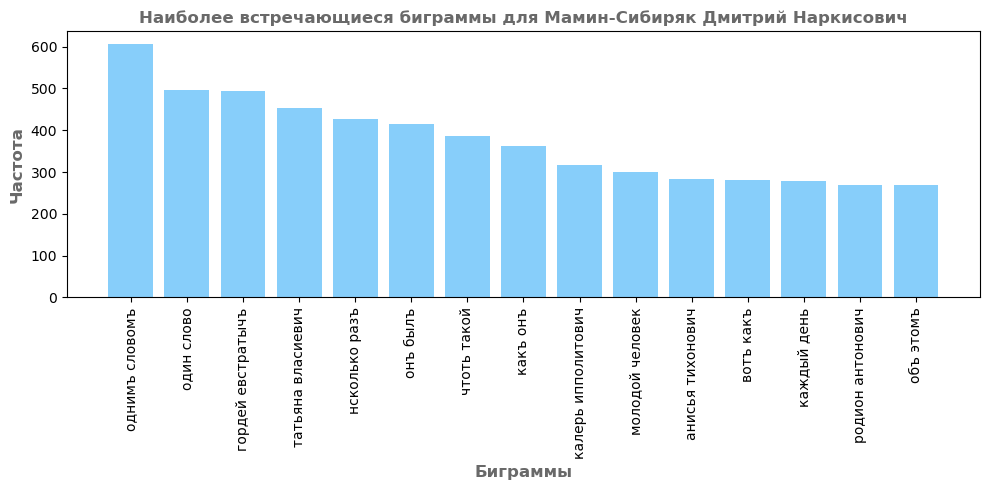

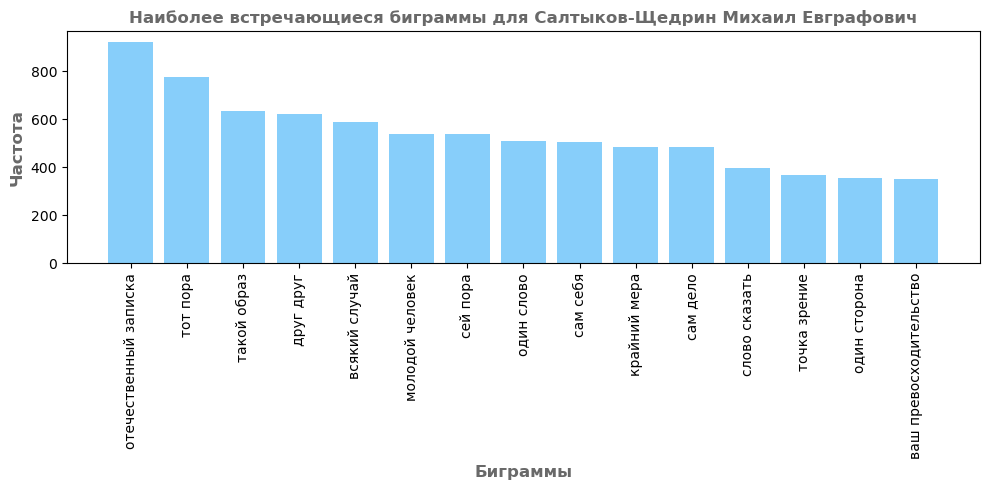

...

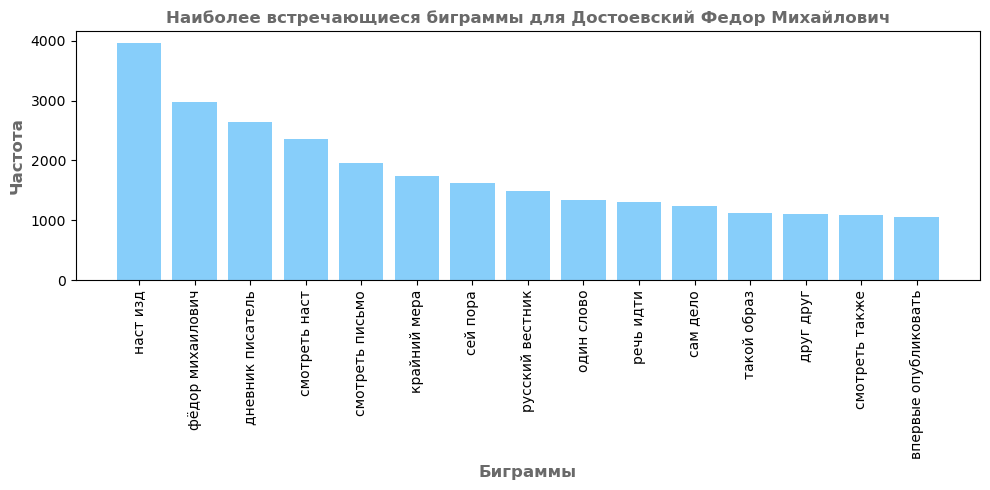

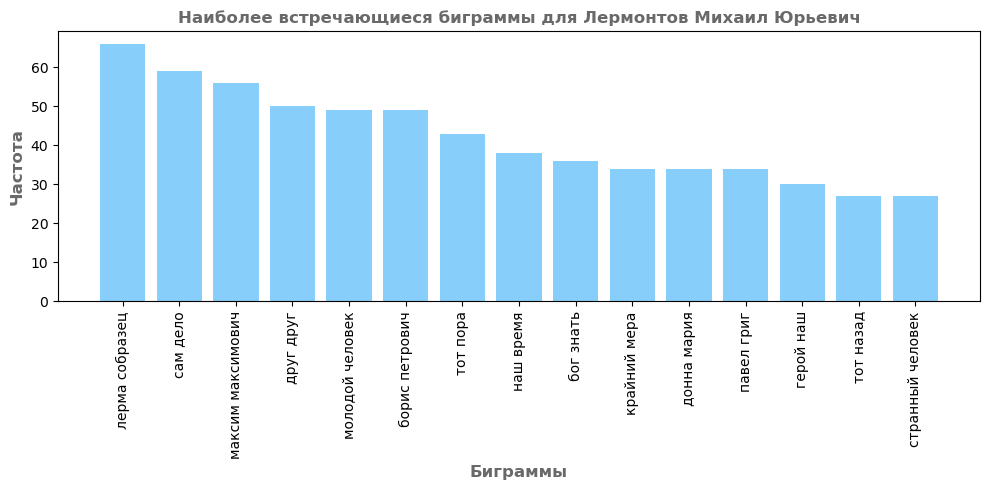

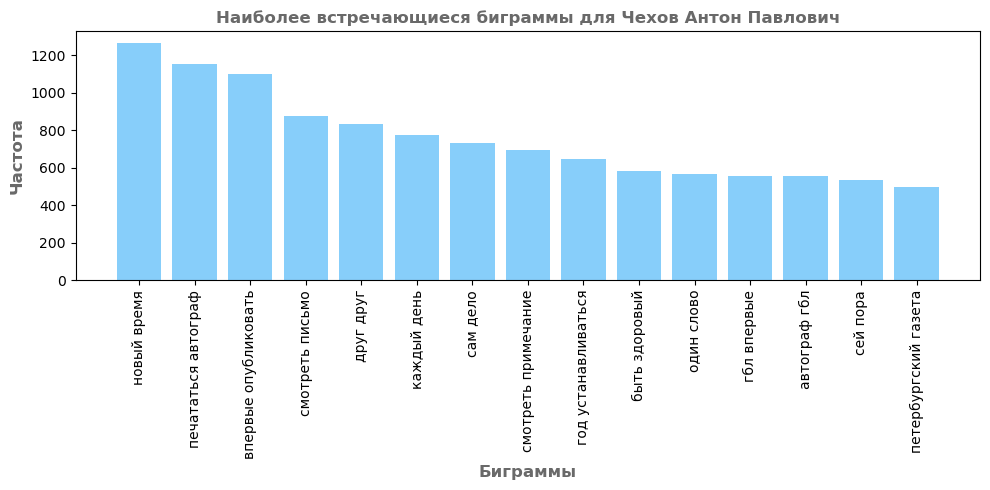

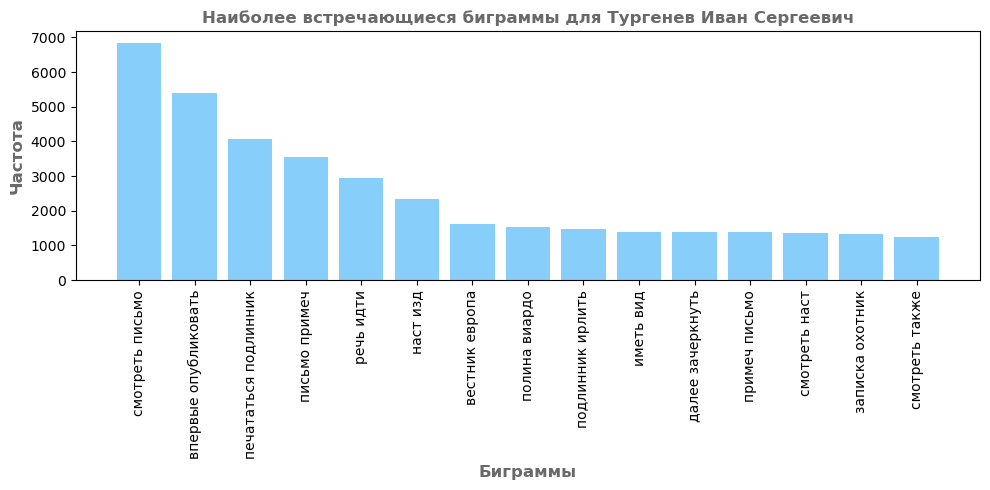

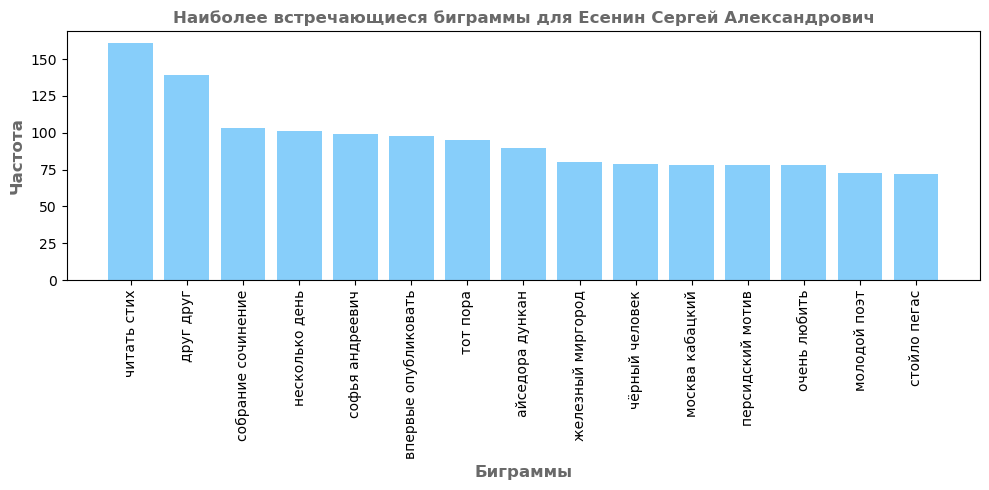

In [51]:
def plot_most_common_bigrams(bigram_counts_dict, n):
    for author, counts in bigram_counts_dict.items():
        filtered_counts = {bigram: count for bigram, count in counts.items() if not any(word in stop_words for word in bigram)}

        most_common = Counter(filtered_counts).most_common(n)
        
        if most_common:
            bigrams, count_values = zip(*most_common)
            bigram_labels = [' '.join(bigram) for bigram in bigrams]

            plt.figure(figsize=(10, 5))
            plt.bar(bigram_labels, count_values, color='#87cefa')
            plt.title(f'Наиболее встречающиеся биграммы для {author}', fontsize=12, fontweight="bold", color="dimgray")
            plt.xlabel('Биграммы', fontsize=12, fontweight="bold", color="dimgray")
            plt.ylabel('Частота', fontsize=12, fontweight="bold", color="dimgray")
            plt.xticks(rotation=90)
            plt.tight_layout()
            plt.show()

plot_most_common_bigrams(bigrams_counts_per_author, n=15)

In [52]:
trigrams_counts_per_author = combine_word_counts(df_with_stat, 'trigrams_counter')

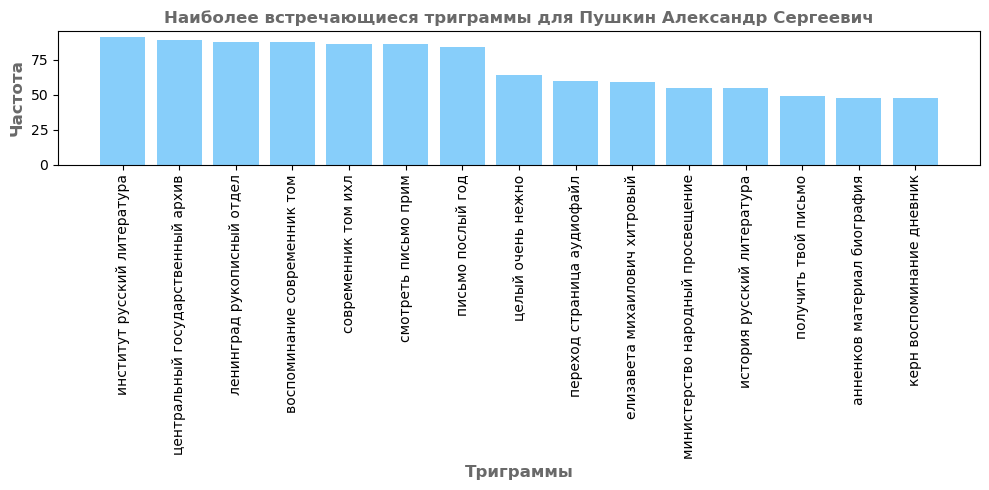

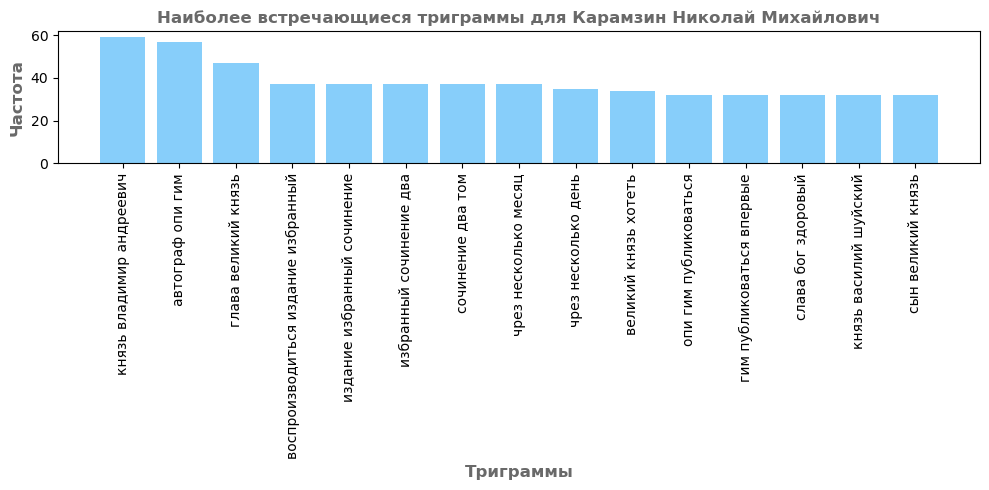

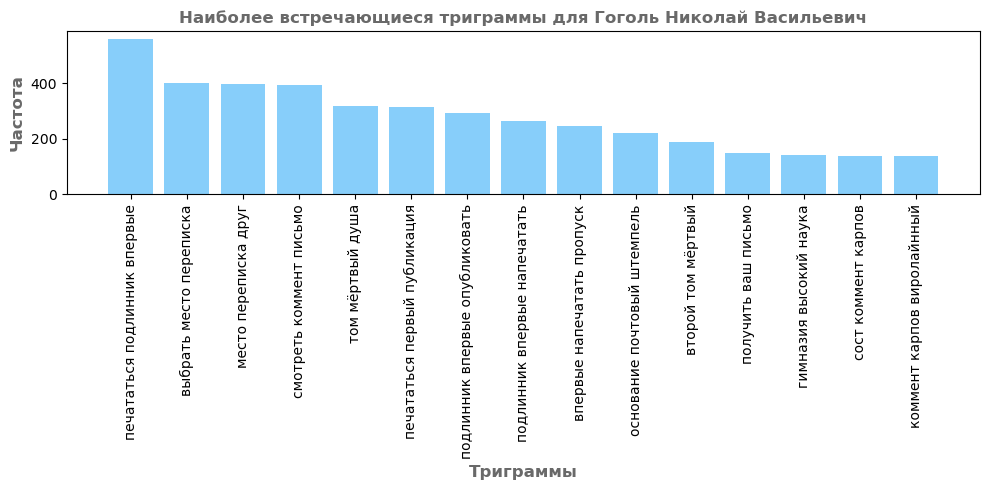

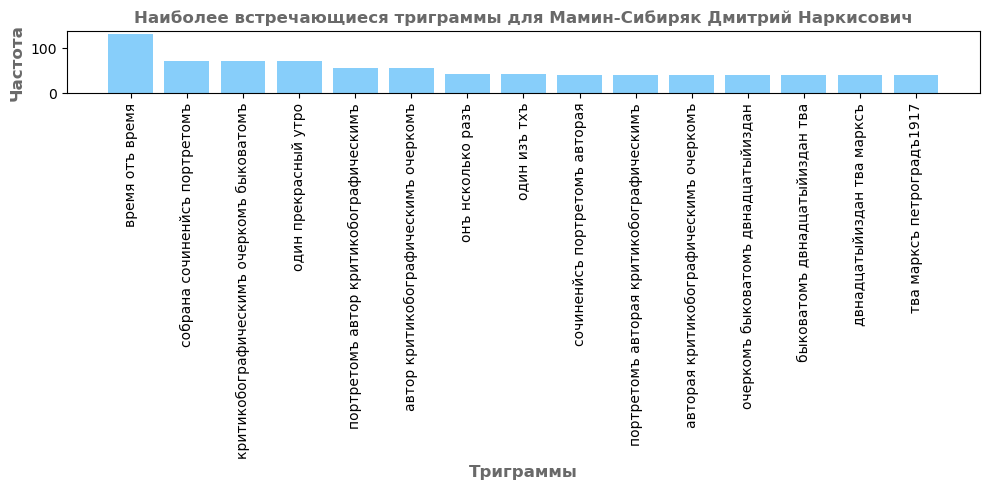

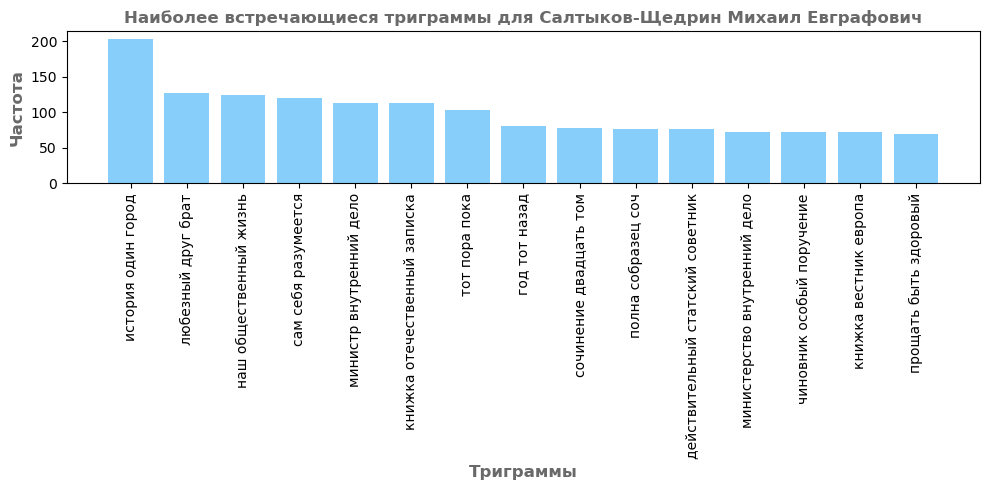

...

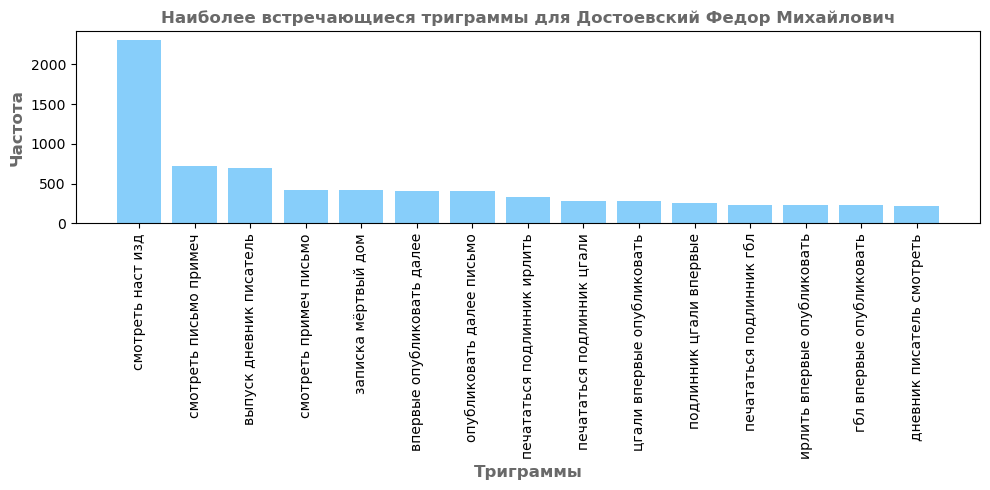

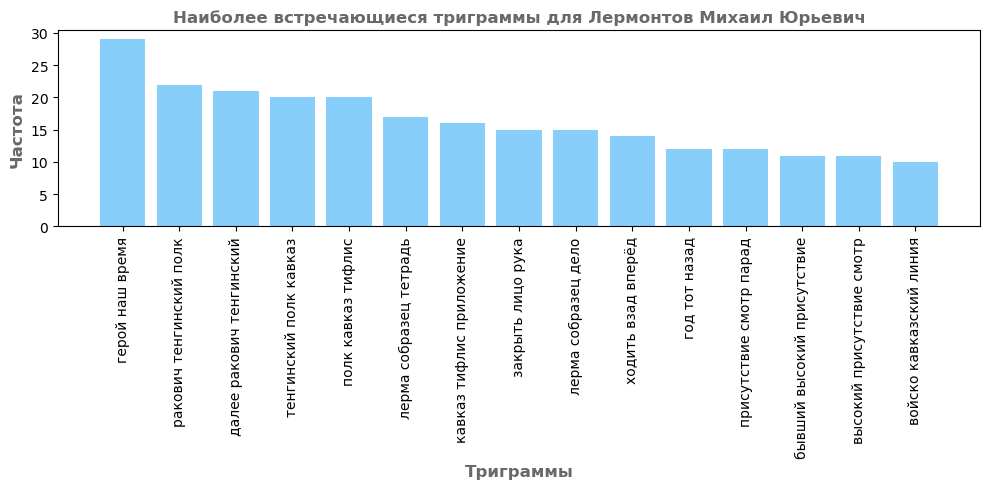

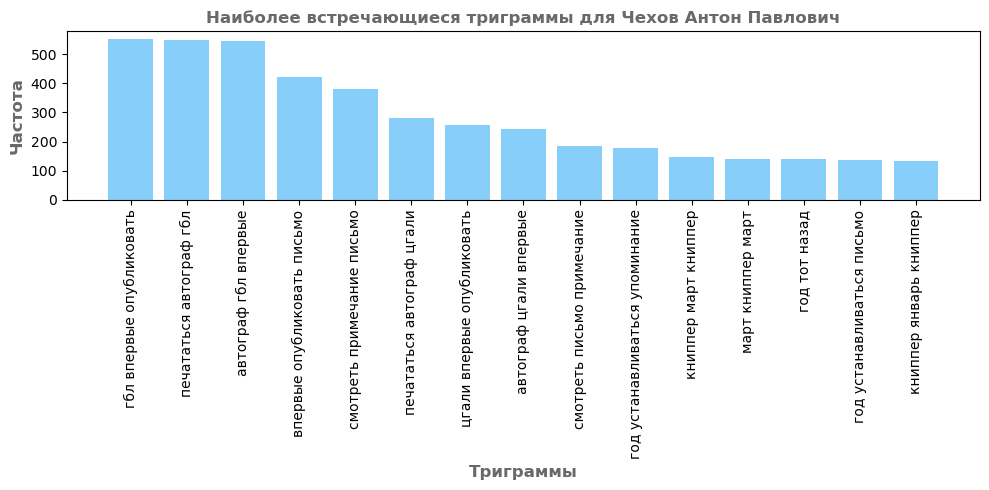

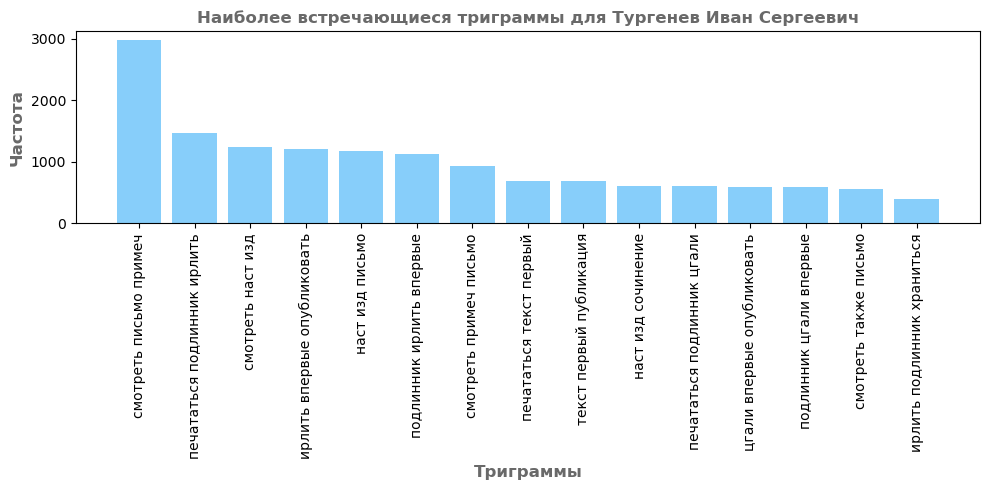

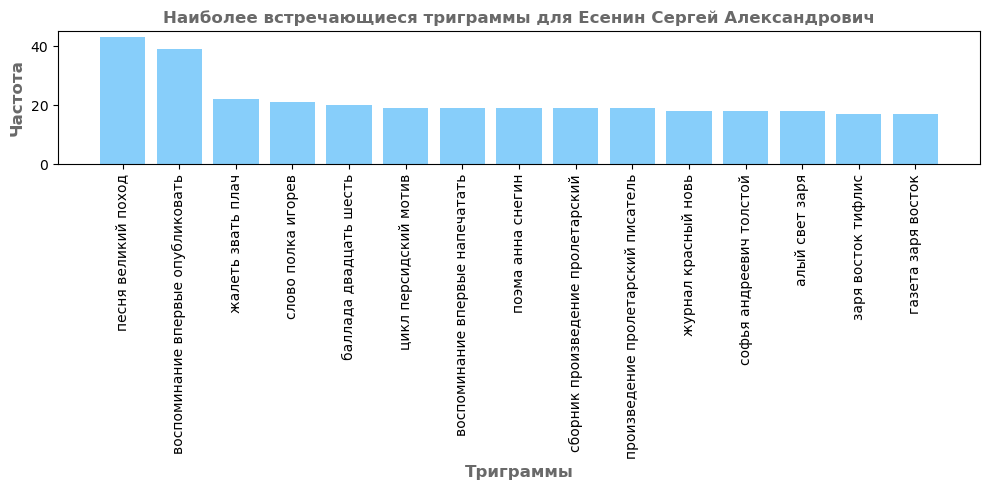

In [53]:
stop_words = {'свой', 'это', 'который', 'так', 'мой', 'стр', 'и', 'в', 'на', 'по', 'не', 'из', 'что', 'к', 'для', 'все', 'как',
              'но', 'пушкинский', 'нмкарамзин', 'ред', 'карамзинъ', 'маминъсибирякъполный', 'собрание', 'салтыков', "салтык"}

def plot_most_common_trigrams(trigram_counts_dict, n=5):
    for author, counts in trigram_counts_dict.items():
        filtered_counts = {trigram: count for trigram, count in counts.items() if not any(word in stop_words for word in trigram)}

        most_common = Counter(filtered_counts).most_common(n)  # Список из кортежей (триграмма, частота)
        
        if most_common:
            trigrams, count_values = zip(*most_common)
            trigram_labels = [' '.join(trigram) for trigram in trigrams]

            plt.figure(figsize=(10, 5))
            plt.bar(trigram_labels, count_values, color='#87cefa')
            plt.title(f'Наиболее встречающиеся триграммы для {author}', fontsize=12, fontweight="bold", color="dimgray")
            plt.xlabel('Триграммы', fontsize=12, fontweight="bold", color="dimgray")
            plt.ylabel('Частота', fontsize=12, fontweight="bold", color="dimgray")
            plt.xticks(rotation=90)
            plt.tight_layout()
            plt.show()

plot_most_common_trigrams(trigrams_counts_per_author, n=15)

> По построенным графикам распределения самых популярных слов, биграмм, триграмм, можно для каждого автора определить пул слов-детерминантов, задающих уникальный стиль произведениям разных авторов. Однако на распределениях мы видим не совсем идеальную картину, и не можем наверняка составлять пул часто используемых автором слов по тому, что видно на графиках. Так графики нам также показали, какие слова необходимо чистить в произведениях каждого автора, прежде чем передавать их будущей модели. Во многих пулах у нас собрались названия издательств произведений, сами названия произведений или другие издательские пометки, не относящихся напрямую к оригинальному содержимому текстов. Для начала можем использовать данные графики чтобы отслеживать по каждому автору то, какие лишние слова необходимо нам еще очищать. Затем, очень хорошо очищенный текст можно будет также заново разбивать на пул популярных слов по каждому автору и использовать их в модели по определению авторства.

### 2.4. Количественное определение частей речи

In [91]:
def parts_of_speech_counter(x):
    doc = nlp(x) 
    pos_counts = Counter([token.pos_ for token in doc])
    print(1)
    return dict(pos_counts)

In [92]:
nlp.max_length = 2700000

df['parts_of_speech'] = df['text_new_without_stop_'].apply(lambda x: parts_of_speech_counter(x))
df

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


,author,title,year,annotation,genres,text,text_new,text_new_without_stop,text_new_without_stop_,lemm,lemm_without_authors,bigrams,trigrams,word_tokens,len_word_tokens,len_word_tokens_without,per_stop_words,parts_of_speech
0,Пушкин Александр Сергеевич,"""Сраженный рыцарь"". Пушкина",1875,NaN,"['Стихотворение', 'Поэзия', 'Дополнительные ма...","\n \nЛитературный альбомъ.\n""Сраженный рыцар...",литературный альбомъ.сраженный рыцарь. пушкин...,"[литературный, альбомъ.сраженный, рыцарь, ., п...",литературный альбомъ.сраженный рыцарь . пушкин...,"[литературный, альбомъсраженный, рыцарь, , пуш...","[литературный, альбомъсраженный, рыцарь, послд...","[(литературный, альбомъсраженный), (альбомъсра...","[(литературный, альбомъсраженный, рыцарь), (ал...","[литературный, альбомъ.сраженный, рыцарь, ., п...",417,345,17.266187,"{'ADJ': 26, 'NOUN': 113, 'PUNCT': 67, 'PROPN':..."
1,Карамзин Николай Михайлович,О достоинстве древних и новых,1802,NaN,"['Очерк', 'Переводы', 'Публицистика', 'Переводы']",\nО достоинстве древних и новых\n(Перевод с не...,о достоинстве древних и новых(перевод с немецк...,"[достоинстве, древних, новых, (, перевод, неме...",достоинстве древних новых ( перевод немецкого ...,"[достоинство, древний, новый, , перевод, немец...","[достоинство, древний, новый, перевод, немецки...","[(достоинство, древний), (древний, новый), (но...","[(достоинство, древний, новый), (древний, новы...","[о, достоинстве, древних, и, новых, (, перевод...",1175,818,30.382979,"{'NOUN': 273, 'ADJ': 120, 'PUNCT': 179, 'DET':..."
2,Гоголь Николай Васильевич,Переписка (1848-1852),1852,Пропущено два разворота.,"['Переписка', 'Эпистолярий', 'Переписка']",\n Гоголь Н. В. Полное собрание сочинений и ...,гоголь н. в. полное собрание сочинений и писе...,"[гоголь, н., в., полное, собрание, сочинений, ...",гоголь н. в. полное собрание сочинений писем :...,"[гоголь, н, в, полный, собрание, сочинение, пи...","[полный, собрание, сочинение, письмо, так, так...","[(полный, собрание), (собрание, сочинение), (с...","[(полный, собрание, сочинение), (собрание, соч...","[гоголь, н., в., полное, собрание, сочинений, ...",234758,165727,29.405175,"{'PROPN': 10682, 'PUNCT': 49480, 'ADP': 1865, ..."
3,Мамин-Сибиряк Дмитрий Наркисович,Злой дух,1898,NaN,"['Рассказ', 'Проза', 'Повести и рассказы разны...",\n \nД. МАМИНЪ-СИБИРЯКЪПОЛНОЕ СОБРАНІЕ СОЧИН...,д. маминъсибирякъполное собране сочиненйтомъ ...,"[д., маминъсибирякъполное, собране, сочиненйто...",д. маминъсибирякъполное собране сочиненйтомъ в...,"[далее, маминъсибирякъполный, собрана, сочинен...","[далее, маминъсибирякъполный, собрана, сочинен...","[(далее, маминъсибирякъполный), (маминъсибиряк...","[(далее, маминъсибирякъполный, собрана), (мами...","[д., маминъсибирякъполное, собране, сочиненйто...",11295,8950,20.761399,"{'PUNCT': 2298, 'ADJ': 621, 'NOUN': 2663, 'PRO..."
4,Мамин-Сибиряк Дмитрий Наркисович,Нимфа,1908,NaN,"['Рассказ', 'Проза', 'Повести и рассказы разны...",\nДмитрий Мамин-Сибиряк\nНимфа\nI.\n Щегольс...,дмитрий маминсибирякнимфа. щегольской волжский...,"[дмитрий, маминсибирякнимфа, ., щегольской, во...",дмитрий маминсибирякнимфа . щегольской волжски...,"[дмитрий, маминсибирякнимф, , щегольский, волж...","[маминсибирякнимф, щегольский, волжский, парох...","[(маминсибирякнимф, щегольский), (щегольский, ...","[(маминсибирякнимф, щегольский, волжский), (ще...","[дмитрий, маминсибирякнимфа, ., щегольской, во...",5576,3924,29.626973,"{'PROPN': 63, 'PUNCT': 1227, 'ADJ': 393, 'NOUN..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2560,Достоевский Федор Михайлович,Историко-критический комментарий к сочинениям ...,1885,NaN,"['Статья', 'Критика', 'О творчестве автора']",\n Историко-критическій комментарій къ сочин...,историкокритическй комментарй къ сочиненямъ ....,"[историкокритическй, комментарй, къ, сочиненям...",историкокритическй комментарй къ сочиненямъ . ...,"[историкокритическть, комментарть, къ, сочинен...","[историкокритическть, комментарть, сочиненямъ,...","[(историкокритическт

In [94]:
# Работа функции занимает очень большое количество времени, поэтому
# после первой работы мы сохранили датафрейм в csv формате, чтобы в дальнейшем просто читать его

df_with_statistics = pd.read_csv("part_2.csv")

In [95]:
df_with_stat['parts_of_speech'] = df_with_statistics['parts_of_speech']
df_with_stat

,author,title,len_text_symb,len_text_word,word_counts,bigrams_counter,trigrams_counter,words_mean,uniq,per_uniq,parts_of_speech
0,Пушкин Александр Сергеевич,"""Сраженный рыцарь"". Пушкина",2180,349,"{'конь': 5, 'али': 3, 'сбруя': 3, 'оттого': 3,...","{('серебряный', 'подкова'): 2, ('легкихъ', 'но...","{('литературный', 'альбомъсраженный', 'рыцарь'...",4.988604,214,51.318945,"{'ADJ': 26, 'NOUN': 113, 'PUNCT': 67, 'PROPN':..."
1,Карамзин Николай Михайлович,О достоинстве древних и новых,6625,999,"{'человек': 12, 'новый': 9, 'наш': 8, 'один': ...","{('достоинство', 'древний'): 2, ('древний', 'н...","{('достоинство', 'древний', 'новый'): 2, ('дре...",5.413930,463,39.404255,"{'NOUN': 273, 'ADJ': 120, 'PUNCT': 179, 'DET':..."
2,Гоголь Николай Васильевич,Переписка (1848-1852),1220615,194298,"{'письмо': 1206, 'который': 1181, 'ваш': 1051,...","{('впервые', 'напечатать'): 158, ('первый', 'п...","{('печататься', 'первый', 'публикация'): 112, ...",5.017780,13180,5.614292,"{'PROPN': 10682, 'PUNCT': 49480, 'ADP': 1865, ..."
3,Мамин-Сибиряк Дмитрий Наркисович,Злой дух,59997,9091,"{'онъ': 95, 'какъ': 89, 'петръ': 84, 'дьякониц...","{('марья', 'антонович'): 23, ('отецъ', 'петръ'...","{('марья', 'антонович', 'какъ'): 3, ('мой', 'б...",5.298151,2890,25.586543,"{'PUNCT': 2298, 'ADJ': 621, 'NOUN': 2663, 'PRO..."
4,Мамин-Сибиряк Дмитрий Наркисович,Нимфа,28308,4355,"{'человек': 50, 'это': 37, 'старик': 35, 'свой...","{('молодой', 'человек'): 25, ('господин', 'хор...","{('гора', 'душа', 'наш'): 8, ('извинить', 'гос...",5.079642,1318,23.637016,"{'PROPN': 63, 'PUNCT': 1227, 'ADJ': 393, 'NOUN..."
...,...,...,...,...,...,...,...,...,...,...,...
2560,Достоевский Федор Михайлович,Историко-критический комментарий к сочинениям ...,881,106,"{'достоевскаго': 4, 'комментарть': 2, 'сочинен...","{('сочиненямъ', 'достоевскаго'): 2, ('историко...","{('историкокритическть', 'комментарть', 'сочин...",7.134615,65,52.419355,"{'VERB': 11, 'PROPN': 31, 'PUNCT': 28, 'ADJ': ..."
2561,Куприн Александр Иванович,Звезда Соломона,171121,25650,"{'цвет': 354, 'это': 114, 'сказать': 86, 'тофф...","{('друг', 'друг'): 13, ('подумать', 'цвет'): 1...","{('мефодий', 'исаевич', 'тоффель'): 3, ('слегк...",5.427038,6326,20.070434,"{'PROPN': 506, 'NOUN': 6655, 'ADJ': 3151, 'PUN..."
2562,Бунин Иван Алексеевич,На край света,9851,1510,"{'гора': 12, 'дорога': 11, 'хата': 10, 'небо':...","{('край', 'свет'): 4, ('великий', 'перевоз'): ...","{('воно', 'така', 'сей'): 2, ('така', 'сей', '...",5.275199,670,36.532170,"{'PROPN': 27, 'NOUN': 436, 'PUNCT': 326, 'ADJ'..."
2563,Салтыков-Щедрин Михаил Евграфович,Внучка панцирного боярина,14885,2169,"{'который': 24, 'роман': 19, 'лажечников': 14,...","{('польский', 'интрига'): 5, ('роман', 'лажечн...","{('читать', 'бокль', 'молешотт'): 3, ('бокль',...",5.641536,819,31.367292,"{'ADJ': 229, 'PUNCT': 475, 'NOUN': 557, 'CCONJ..."


## 2. Анализ метаинформации

В данном разделе необходимо выполнить следующие пункты:
- Проанализировать атрибуты
- Изучить корреляцию между этими признаками и текстами

### 2.1. Анализ аннотаций

In [107]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2565 entries, 0 to 2564
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   author      2565 non-null   object
 1   title       2565 non-null   object
 2   year        2565 non-null   object
 3   annotation  530 non-null    object
 4   genres      2565 non-null   object
 5   text        2565 non-null   object
dtypes: object(6)
memory usage: 204.8+ KB


> Столбец annotation имеет только 530 непустых значений, что составляет около 20.7% от общего объема записей.

In [49]:
# 530 - кол-во ненулевых аннотаций.
notna_ann = len(df[~df['annotation'].isna()])
print(f"Количество записей с наличием аннотации: {notna_ann}")
print(f"Доля произведений с наличием аннотации: {round(notna_ann / len(df), 2)}")

Количество записей с наличием аннотации: 530
Доля произведений с наличием аннотации: 0.21


Как видим, незначительная доля произведений содержит признак аннотации, поэтому его анализ не принесет много полезной информации. Проведем базовый анализ:

In [50]:
# Добавляем флаг наличия аннотации
df['annotation_present'] = df['annotation'].notna()

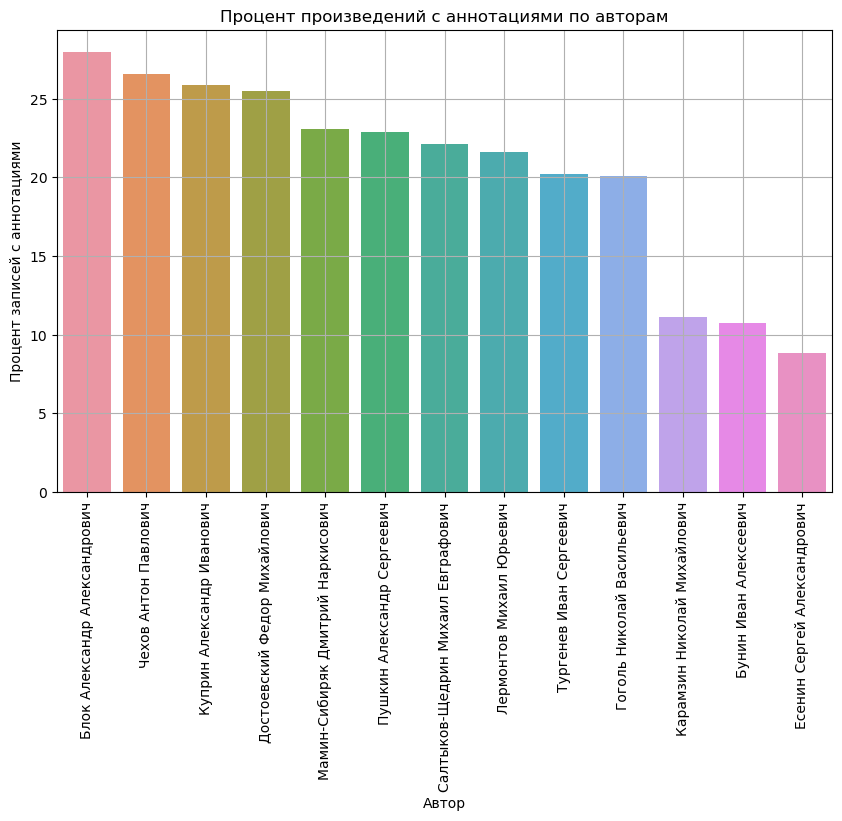

In [51]:
author_ann_per = round(df.groupby('author')['annotation_present'].mean() * 100, 2)
author_ann_per = author_ann_per.sort_values(ascending=False)

# Визуализируем процент записей с аннотациями по авторам
plt.figure(figsize=(10, 6))
sns.barplot(x=author_ann_per.index, y=author_ann_per.values)
plt.xticks(rotation=90)
plt.xlabel("Автор")
plt.ylabel("Процент записей с аннотациями")

plt.title("Процент произведений с аннотациями по авторам")
plt.grid(True)
plt.show()

В качесиве еще одного доказательства неинформативности используем $\text{TF-IDF}$ для выявления ключевых слов и понимания распределения информации в аннотациях:

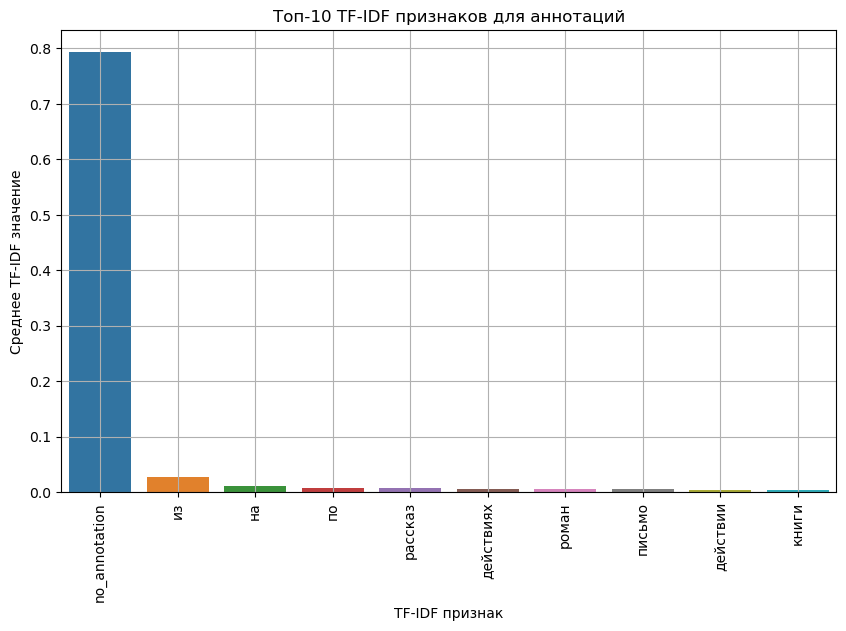

In [52]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Заполним пустые аннотации специальной меткой
df['annotation'] = df['annotation'].fillna('no_annotation')

# Преобразуем текст аннотаций в числовые признаки с помощью TF-IDF
tfidf_vectorizer = TfidfVectorizer(max_features=50)
annotations_tfidf = tfidf_vectorizer.fit_transform(df['annotation'])
annotations_tfidf_df = pd.DataFrame(annotations_tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Визуализация топ-10 TF-IDF признаков для анализа
top_features = annotations_tfidf_df.mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(10, 6))
sns.barplot(x=top_features.index, y=top_features.values)
plt.xticks(rotation=90)
plt.xlabel("TF-IDF признак")
plt.ylabel("Среднее TF-IDF значение")

plt.title("Топ-10 TF-IDF признаков для аннотаций")
plt.grid(True)
plt.show()

Метка отсутствия аннотации имеет наибольший вес, далее идут общие слова. Это говорит о низкой информативности атрибута аннотации в рамках общего датасета.

### 2.2. Анализ жанров

In [56]:
df['genres'] = df['genres'].apply(ast.literal_eval)
df['genres']

ValueError: malformed node or string: ['Стихотворение', 'Поэзия', 'Дополнительные материалы', 'Иллюстрации/приложения: 1 штук.']

In [60]:
print(f"Исходное кол-во уникальных жанров: {len(df['genres'].explode().unique())}")

Исходное кол-во уникальных жанров: 127


Если посмотреть на атрибут жанра, то можно увидеть, что одному произведению как правило соответствует несколько жанров. При этом ряд из них повторяет друг друга, например:<br>
Есть жанры $\text{a}$ и $\text{b}$. Они могут присутсвовать как отдельные элементы списка, а также в формате "$\text{a и b}$" или "$\text{a, b}$". Такие представления нужно разбить и убрать дубликаты.<br>
Также есть немало жанров вида "$\text{иллюстрации/приложения: n штук.}$", где $\text{n}$ - некоторое произвольное число. Объединим такие жанры в единую группу "$\text{иллюстрации/приложения}$".

In [61]:
# Функция для приведения жанров к единому виду
def clean_genres(genres):
    cleaned_genres = []
    for genre in genres:
      # Приводим к нижнему регистру
      genre = genre.lower()
      if re.match(r'иллюстрации/приложения:\s*\d+\s*\w*', genre):
        cleaned_genres.append('иллюстрации/приложения')
      else:
        # Разделяем жанры по запятым или по союзу 'и'
        split_genres = re.split(r',\s*|\s+и\s+', genre)
        cleaned_genres.extend(split_genres)

    return list(set(cleaned_genres))

In [62]:
df['genres'] = df['genres'].apply(clean_genres)
print(f"Кол-во уникальных жанров после очистки: {len(df['genres'].explode().unique())}")

Кол-во уникальных жанров после очистки: 106


In [63]:
all_genres = df['genres'].explode()
genre_counts = all_genres.value_counts()
# Жанры, которые встречаются более 50 раз
genre_counts[genre_counts >= 50]

проза                         933
публицистика                  863
статья                        707
критика                       641
рассказ                       627
очерк                         490
переписка                     284
эпистолярий                   245
мемуары                       236
повести                       235
переводы                      194
об авторе                     149
поэзия                        149
воспоминания                  144
рассказы разных лет           128
неоконченное                  120
поэтические опыты             120
о творчестве автора           115
иллюстрации/приложения        104
рассказы                       91
драматургия                    86
пьеса                          78
повесть                        78
книги очерков                  64
поэма                          59
дополнительные материалы       59
глава                          55
рассказы 1918 - 1937 годов     55
романы                         52
поэмы         

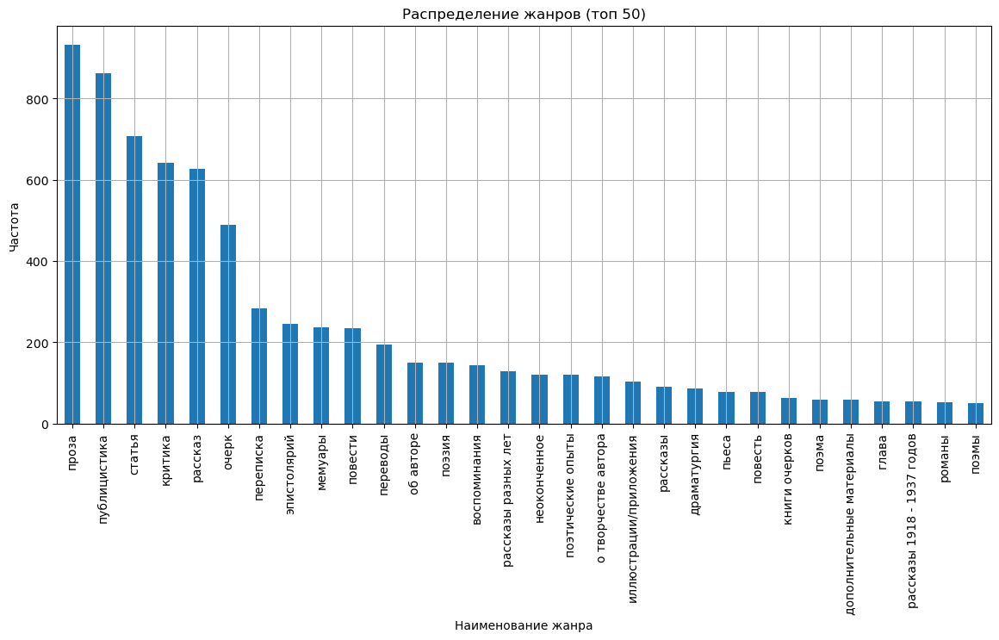

In [64]:
# Построение графика распределения жанров
# Используем только жанры, которые встречаются более 50 раз, иначе график будет нечитабельный
plt.figure(figsize=(14, 6))
genre_counts[genre_counts >= 50].plot(kind='bar')
plt.title("Распределение жанров (топ 50)")
plt.xlabel("Наименование жанра")
plt.ylabel("Частота")

plt.grid(True)
plt.show()

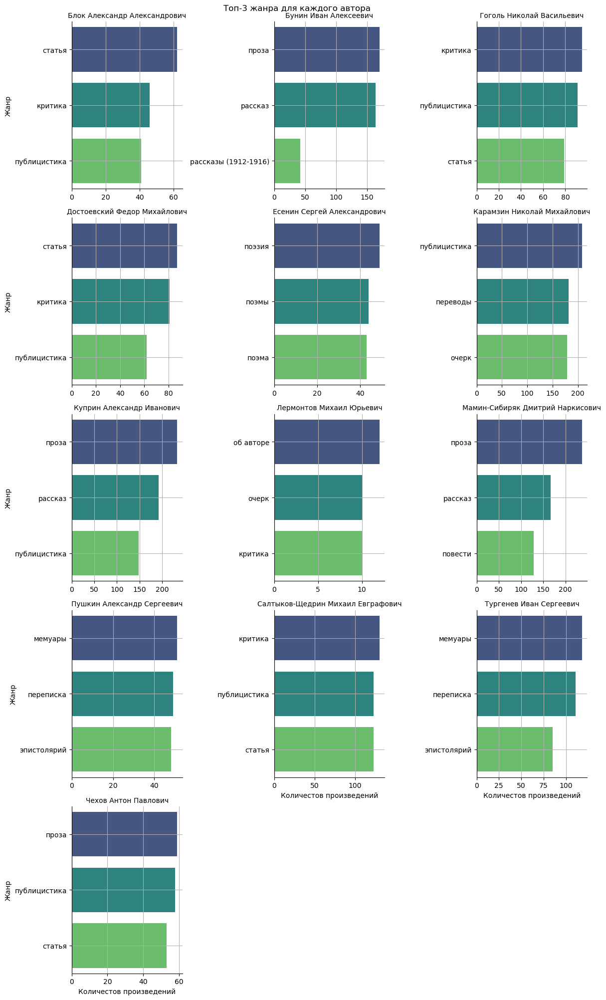

In [69]:
# Развернем список жанров в отдельные строки
df_exploded = df.explode('genres').dropna(subset=['genres'])

# Подсчитаем количество жанров для каждого автора и отберем топ-3
top_genres_by_author = (
    df_exploded.groupby('author')['genres']
    .apply(lambda x: Counter(x).most_common(3))
    .reset_index(name='top_genres')
)

# Преобразуем данные для визуализации
top_genres_expanded = top_genres_by_author.explode('top_genres').dropna()
top_genres_expanded['genre'] = top_genres_expanded['top_genres'].apply(lambda x: x[0])
top_genres_expanded['count'] = top_genres_expanded['top_genres'].apply(lambda x: x[1])
top_genres_expanded = top_genres_expanded.drop(columns='top_genres')

# Создаем отдельные графики по каждому автору с `hue=genre` и отключаем легенду
g = sns.FacetGrid(top_genres_expanded, col="author", col_wrap=3, sharex=False, sharey=False, height=4)
g.map_dataframe(sns.barplot, x='count', y='genre', hue='genre', palette="viridis", dodge=False)
g.set_axis_labels("Количестов произведений", "Жанр")
g.set_titles("{col_name}")

g.fig.suptitle("Топ-3 жанра для каждого автора", y=1)
for ax in g.axes.flat:
    ax.grid(True)
plt.show()

Теперь проанизируем признак эмоционального тона, определяемого с помощью $\text{TextBlob}$:

In [72]:
from textblob import TextBlob

# Функция для определения тональности
def get_sentiment(text):
    blob = TextBlob(text)
    polarity = blob.sentiment.polarity
    if polarity > 0:
        return 'positive'
    elif polarity < 0:
        return 'negative'
    else:
        return 'neutral'

In [73]:
# Код выполняется в районе 10 минут
df['sentiment'] = df['text'].apply(get_sentiment)

In [74]:
df['sentiment']

0        neutral
1       negative
2       positive
3        neutral
4        neutral
          ...   
2560     neutral
2561     neutral
2562     neutral
2563     neutral
2564     neutral
Name: sentiment, Length: 2565, dtype: object

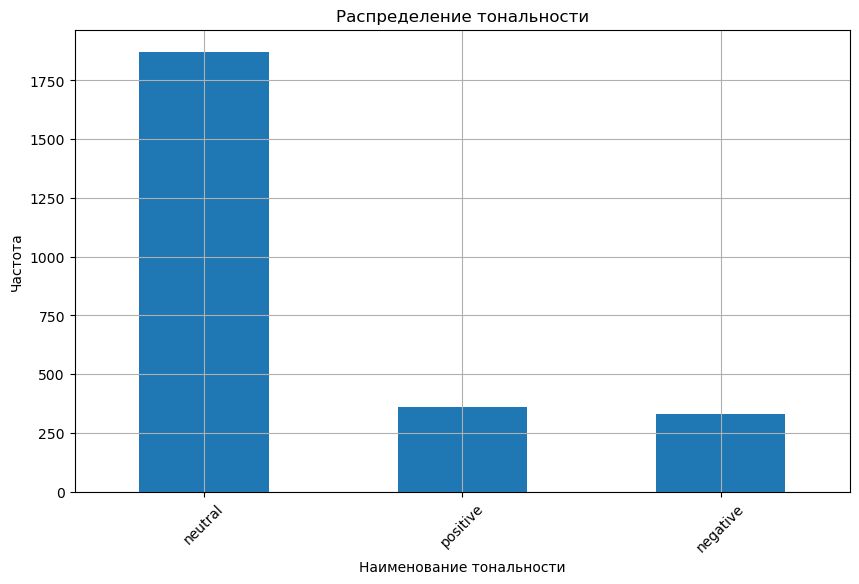

In [75]:
# Построение графика распределения метки эмоционального тона
plt.figure(figsize=(10, 6))
df['sentiment'].value_counts().plot(kind='bar')
plt.title("Распределение тональности")
plt.xlabel("Наименование тональности")
plt.ylabel("Частота")
plt.xticks(rotation=45)

plt.grid(True)
plt.show()

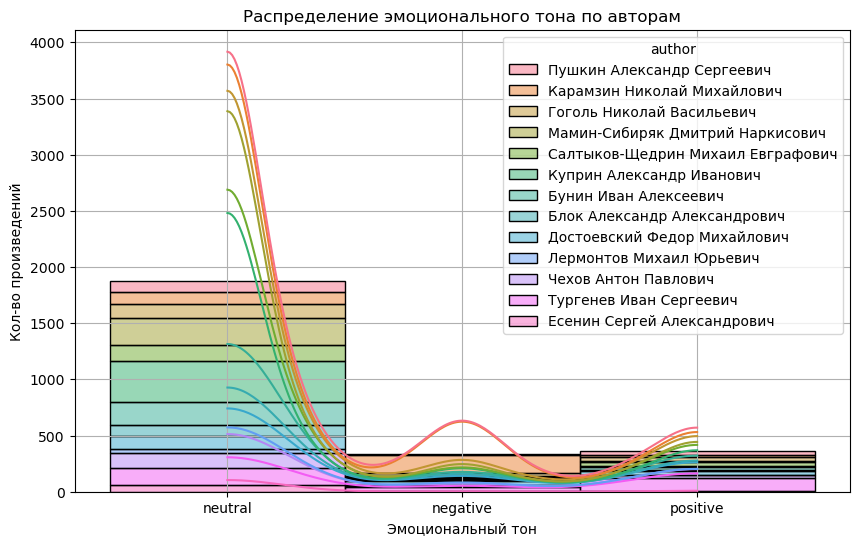

In [76]:
# Визуализация распределения метки эмоционального тона по авторам со слаженной линией распределения
# Построим гистограмму распределения sentiment по авторам
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='sentiment', hue='author', multiple='stack', bins=20, kde=True)
plt.xlabel("Эмоциональный тон")
plt.ylabel("Кол-во произведений")
plt.title("Распределение эмоционального тона по авторам")
plt.grid(True)
plt.show()

## 3. Изучение связи между текстовыми признаками и целевой переменной
Анализ между количеством символов/слов и автором уже был ранее, также были построены графики (см. пункт 1.2.)

### 3.1. Доля стоп-слов

In [59]:
df["word_tokens"] = df["text_new"].apply(word_tokenize)

In [61]:
df["len_word_tokens"] = df["word_tokens"].apply(len)
df["len_word_tokens_without"] = df["text_new_without_stop"].apply(len)

In [75]:
df['per_stop_words'] = ((df["len_word_tokens"] - df["len_word_tokens_without"]) / df["len_word_tokens"]) * 100

In [79]:
df[df['per_stop_words'] == 0]

,author,title,year,annotation,genres,text,text_new,text_new_without_stop,text_new_without_stop_,lemm,lemm_without_authors,bigrams,trigrams,word_tokens,len_word_tokens,len_word_tokens_without,per_stop_words
1918,Гоголь Николай Васильевич,Viy,2000,NaN,"['Рассказ', 'Проза', 'Переводы на иностранные ...",\nNikolay Gogol. Viy\n Translated by Richard...,". : . , . . 1 1 . ( ) , . , , , , , . , , , ,...","[., :, ., ,, ., ., 1, 1, ., (, ), ,, ., ,, ,, ...",". : . , . . 1 1 . ( ) , . , , , , , . , , , , ...","[, , , , , , 1, 1, , , , , , , , , , , , , , ,...",[],[],[],"[., :, ., ,, ., ., 1, 1, ., (, ), ,, ., ,, ,, ...",2233,2233,0.0


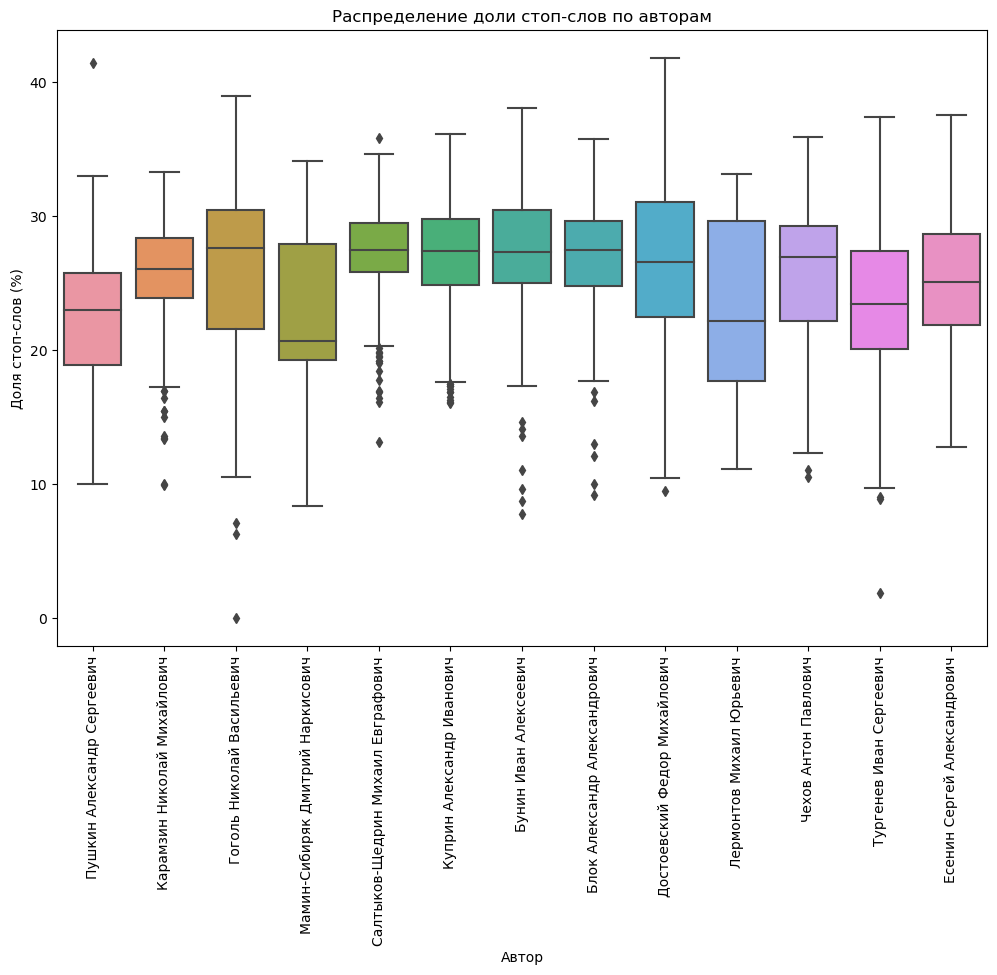

In [76]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='author', y='per_stop_words', data=df)
plt.xticks(rotation=90)
plt.xlabel('Автор')
plt.ylabel('Доля стоп-слов (%)')
plt.title('Распределение доли стоп-слов по авторам')
plt.show()

> Визуализация долей стоп-слов по авторам показывает хороший разброс данных для разных авторов, в целом можно использовать для определения авторства

### 3.2. Средняя длина слова по авторам

In [56]:
def calculate_avg_word_length(text):
    words = re.findall(r'\b\w+\b', text)

    total_length = sum(len(word) for word in words)

    total_words = len(words)

    avg_word_length = total_length / total_words if total_words > 0 else 0
    
    return avg_word_length
    
df_with_stat["words_mean"] = df["text_new"].apply(calculate_avg_word_length)

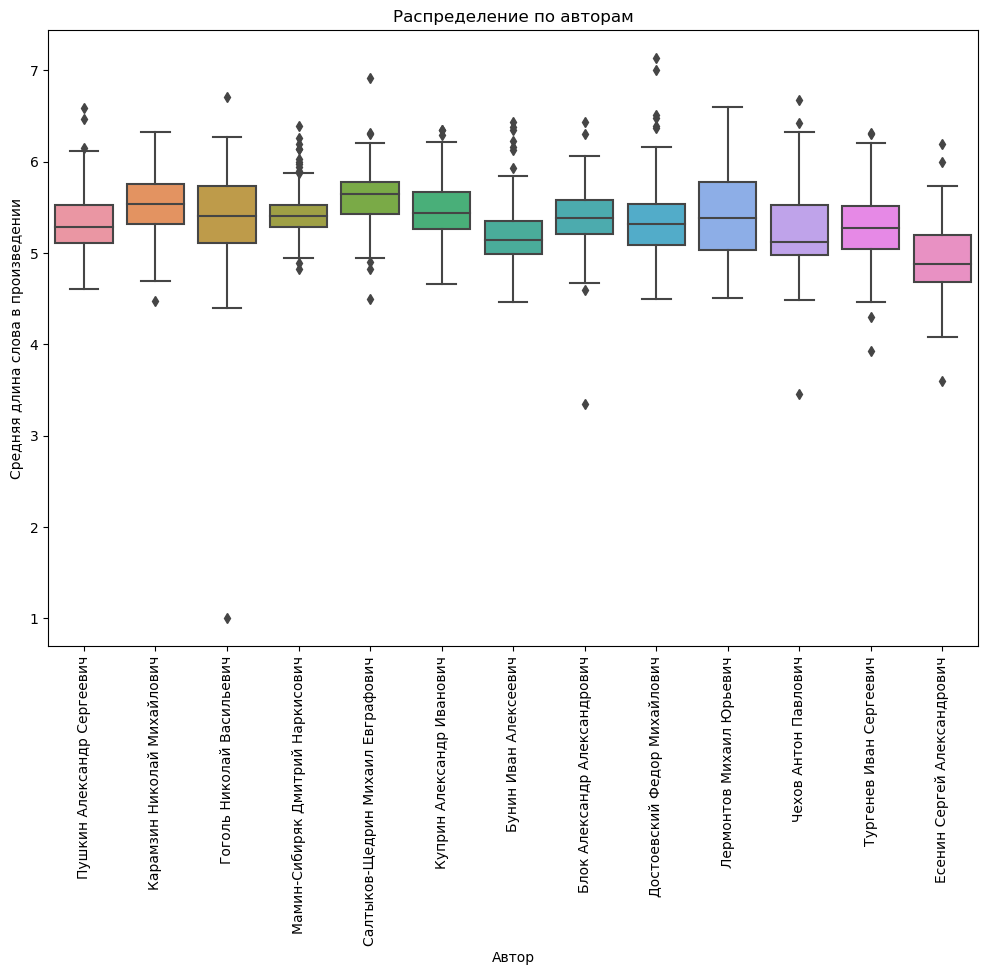

In [81]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='author', y='words_mean', data=df_with_stat)
plt.xticks(rotation=90)
plt.xlabel('Автор')
plt.ylabel('Средняя длина слова в произведении')
plt.title('Распределение по авторам')
plt.show()

> Визуализация средней длины слова в произведениях авторов показало не сильный разброс в данных, в целом, не считая единичного выброса у Гоголя, средняя длина слова практически у всех одинаковая и варьируется практически в одних и тех же значениях. Использовать данный параметр для будущей модели кажется нецелесообразным

### 3.3. Количество уникальных слов после лемматизации

In [83]:
df_with_stat["uniq"] = df_with_stat["word_counts"].apply(len)

In [87]:
df_with_stat["per_uniq"] = df_with_stat["uniq"] / df['len_word_tokens'] * 100

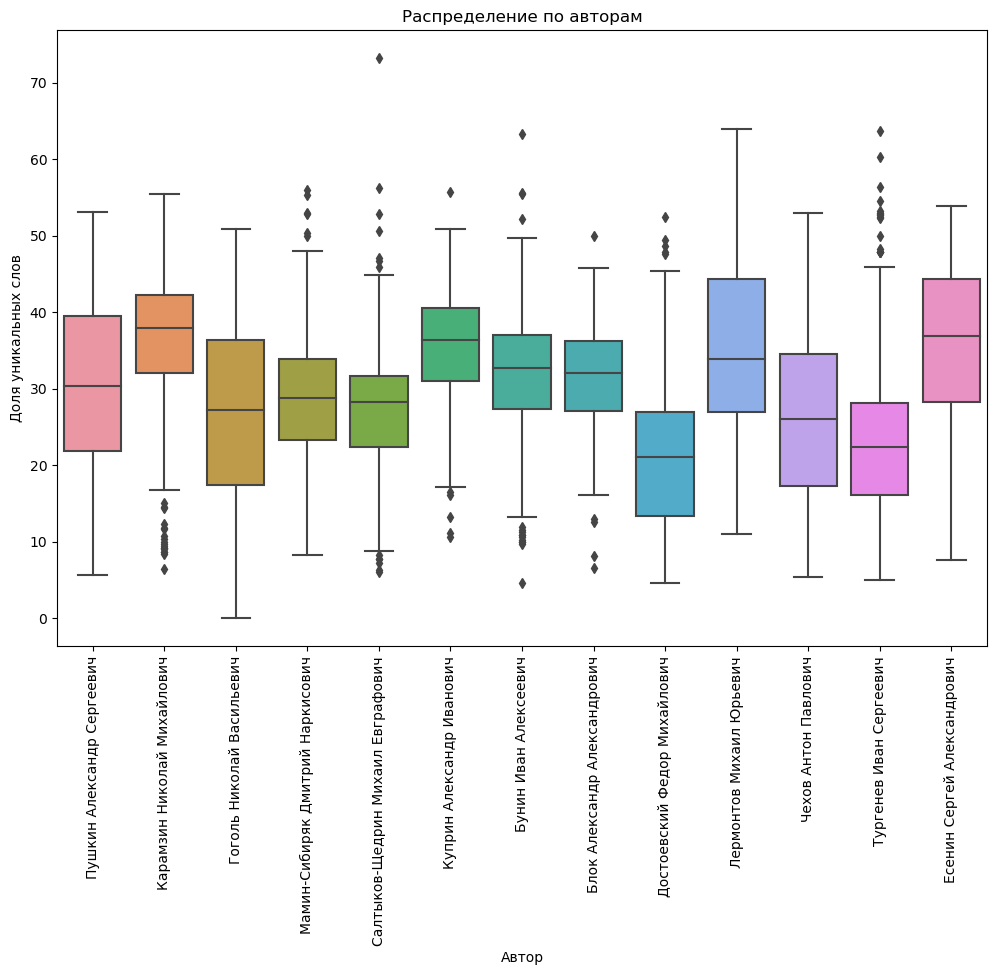

In [90]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='author', y='per_uniq', data=df_with_stat)
plt.xticks(rotation=90)
plt.xlabel('Автор')
plt.ylabel('Доля уникальных слов')
plt.title('Распределение по авторам')
plt.show()

> Визуализация распределения доли уникальных слов в произведениях авторов показывает довольно хорошую и разнообразную картину. Можно четко наблюдать разницу в частоте использования слов в сравнении двух различных авторов (например Достоевский использует в среднем меньше уникальных слов, чем другие авторы, в то время как Карамзин, Куприн, Есенин, по своей медиане, разделяют между собой "первенство" в использовании уникальных слов в своих текстах (это можно прослеживать в том числе в связке количества слов в их текстах в целом)). Данный параметр можно использовать для будущей модели определения авторства текстов

### 3.4. Доля частей речи в общем количестве слов (после очистики от стоп-слов)

In [107]:
df_with_stat["word_tokens_without"] = df["text_new_without_stop_"]

In [114]:
df_with_stat['parts_of_speech'] = df_with_stat['parts_of_speech'].apply(ast.literal_eval)

In [120]:
for pos in pos_list:
    df[f'{pos}_ratio'] = df_with_stat.apply(
        lambda x: x['parts_of_speech'].get(pos, 0) / len(x["word_tokens_without"]) * 100 if x["word_tokens_without"] else 0,
        axis=1
    )

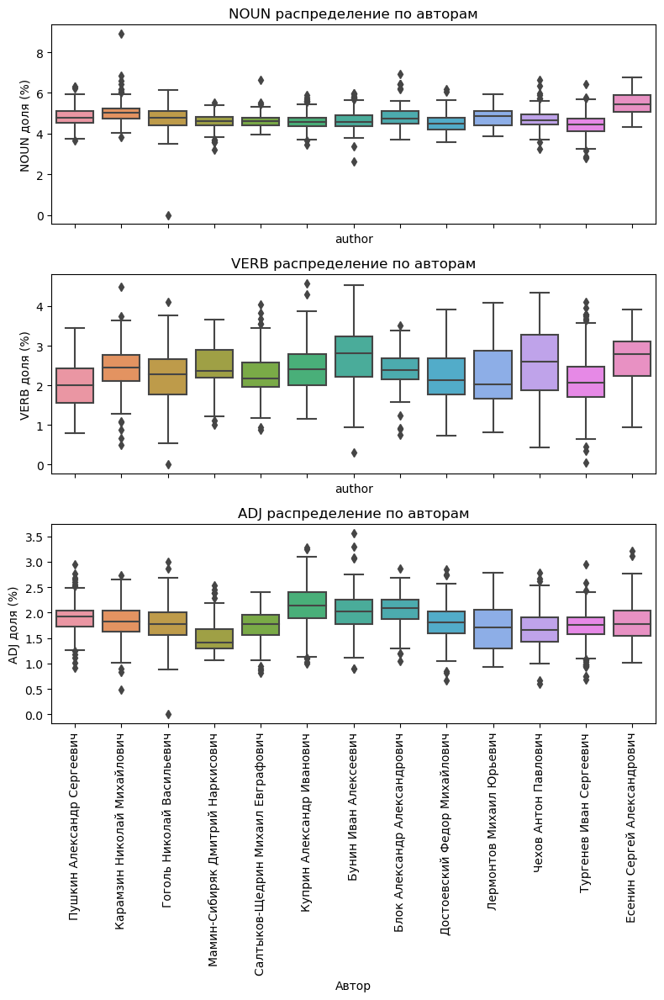

In [140]:
fig, axes = plt.subplots(len(pos_list), 1, figsize=(8, 12), sharex=True)
for i, pos in enumerate(pos_list):
    sns.boxplot(data=df, x='author', y=f'{pos}_ratio', ax=axes[i])
    axes[i].set_title(f'{pos} распределение по авторам')
    axes[i].set_ylabel(f'{pos} доля (%)')

axes[-1].set_xlabel('Автор')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

> Визуализация распределений частей речи по авторам показывает интересную картину. Если учитывать все выбросы, то распределение частей речи между авторами имеет интересную картину, и в теории можно было бы это использовать для модели. Однако если смотреть на график, не учитывая визуализированные выбросы по авторам, то они имеет совсем не сильный разброс в распределениях, что говорит нам о том, что использование данных параметров будет негодной для модели. 

### 3.5. Средняя длина предложений по словам

In [150]:
def calc_avg_sentence_length(row):
    sentences = sent_tokenize(row['text_new'])
    avg_sentence_length = len(row['word_tokens']) / len(sentences) if len(sentences) > 0 else 0
    return avg_sentence_length

df['avg_sentence_length'] = df.apply(calc_avg_sentence_length, axis=1)

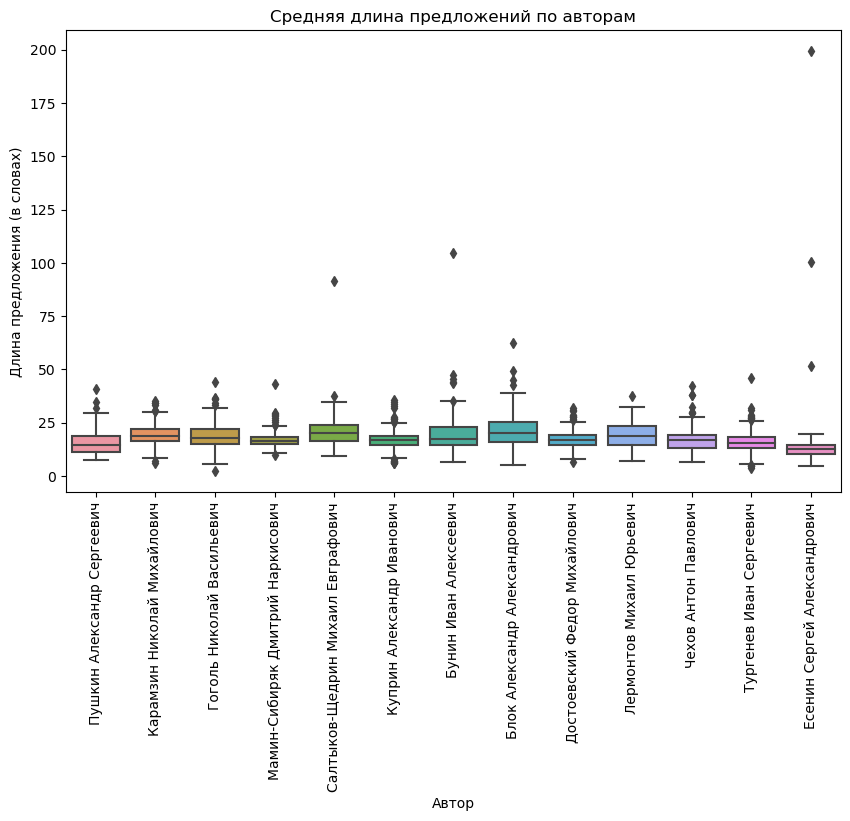

In [154]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='author', y='avg_sentence_length')
plt.title('Средняя длина предложений по авторам')
plt.xlabel('Автор')
plt.ylabel('Длина предложения (в словах)')
plt.xticks(rotation=90)
plt.show()

> Визуализация распределения средней длины предложения в словах по авторам показывает хороший разброс данных распределения, если учитывать отображаемые выбросы. Например, самое длинное предложение среди авторов можно наблюдать у Есенина, согласно выбросу на графике (это вероятно связано с тем, что автор пишет произведения стихами, в которых пунктуация может соблюдаться в совсем неявном и неочевидном виде, от чего одно предложение по словам может растянуться очень далеко). В целом, если учитывать данные выбросы как вещественные признаки, то параметр является также годным для будущего обучения модели.

### 3.6. Анализ типов синтаксических конструкций

In [155]:
def calc_sentence_types(tokens):
    question_count = tokens.count('?')
    exclamation_count = tokens.count('!')
    declarative_count = tokens.count('.')
    
    return {
        'question_count': question_count,
        'exclamation_count': exclamation_count,
        'declarative_count': declarative_count
    }

In [158]:
df_with_stat[['question_count', 'exclamation_count', 'declarative_count']] = df['word_tokens'].apply(lambda tokens: pd.Series(calc_sentence_types(tokens)))

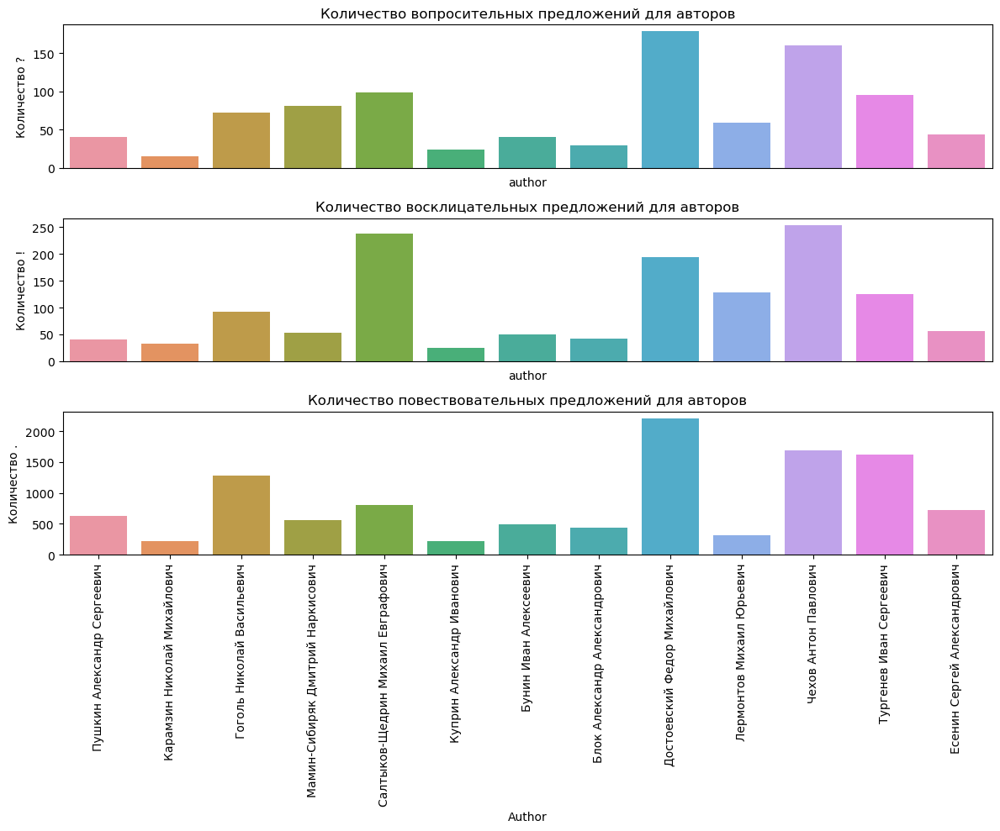

In [164]:
plt.figure(figsize=(12, 10))

plt.subplot(3, 1, 1)
sns.barplot(data=df_with_stat, x='author', y='question_count', ci=None)
plt.title('Количество вопросительных предложений для авторов')
plt.ylabel('Количество ?')
plt.xticks([]) 

plt.subplot(3, 1, 2)
sns.barplot(data=df_with_stat, x='author', y='exclamation_count', ci=None)
plt.title('Количество восклицательных предложений для авторов')
plt.ylabel('Количество !')
plt.xticks([]) 

plt.subplot(3, 1, 3)
sns.barplot(data=df_with_stat, x='author', y='declarative_count', ci=None)
plt.title('Количество повествовательных предложений для авторов')
plt.ylabel('Количество .')

plt.xlabel('Author')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

> Визуализация распределения количества предложений разного типа на трех графиках имеет схожую между собой картину, однако показывает сильный разброс в данных между авторами. Скорее всего переменная сильно коррелирует с другой переменной (например, с количеством предложений (или слов) в текстах в целом), от чего и наблюдается такой результат. Из-за этого, использовать такой параметр может быть не совсем целесообразным.

## 4. Визуализация данных

В данном разделе необходимо выполнить следующие пункты:
- Распределение классов, меток и числовых признаков
- Облако наиболее частотных слов и биграмм (`Word Clouds`)

In [207]:
df['author'].value_counts()

Куприн Александр Иванович            390
Тургенев Иван Сергеевич              302
Карамзин Николай Михайлович          287
Мамин-Сибиряк Дмитрий Наркисович     256
Бунин Иван Алексеевич                233
Достоевский Федор Михайлович         200
Гоголь Николай Васильевич            189
Салтыков-Щедрин Михаил Евграфович    181
Чехов Антон Павлович                 173
Пушкин Александр Сергеевич           131
Блок Александр Александрович         118
Есенин Сергей Александрович           68
Лермонтов Михаил Юрьевич              37
Name: author, dtype: int64

### 4.1. Тепловая карта для авторов

In [165]:
df['per_uniq'] = df_with_stat['per_uniq']
df['words_mean'] = df_with_stat['words_mean']

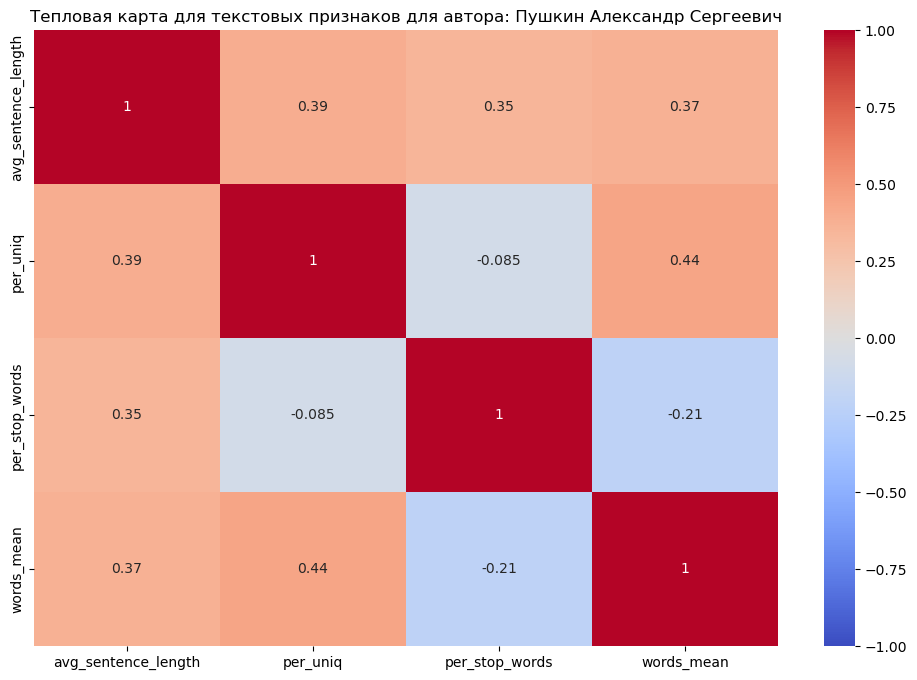

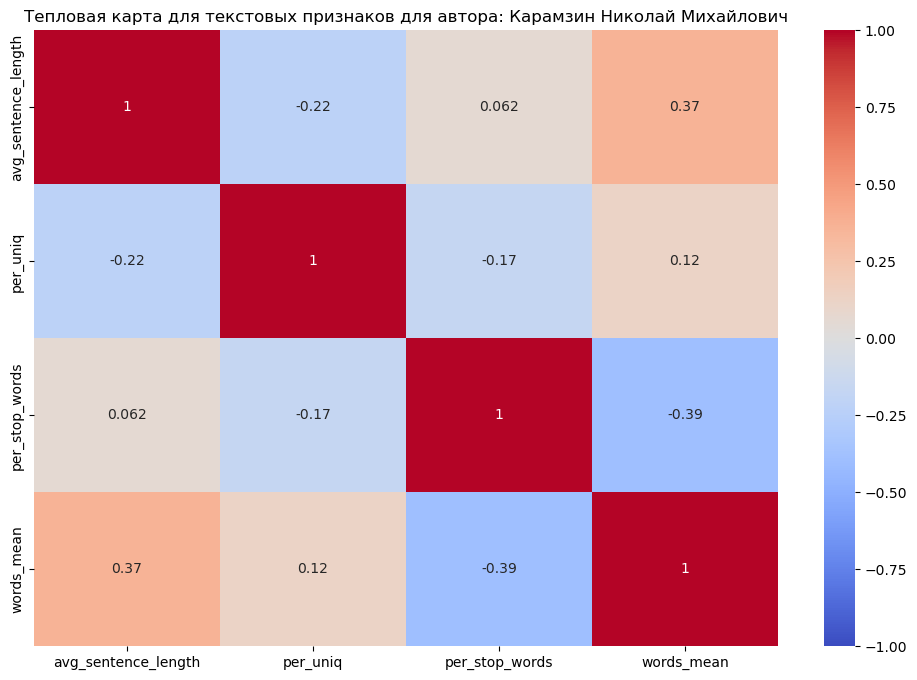

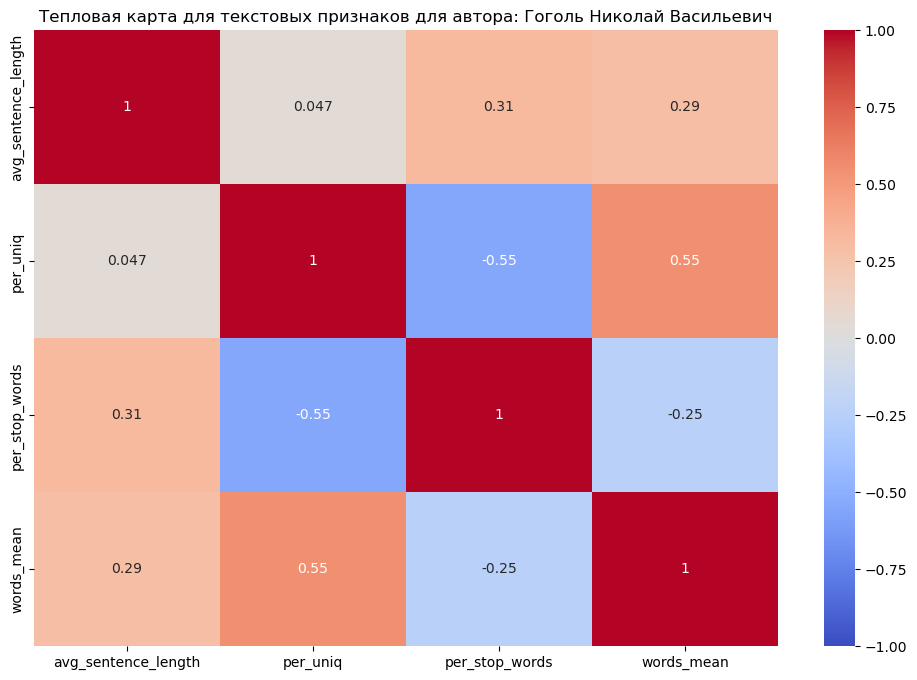

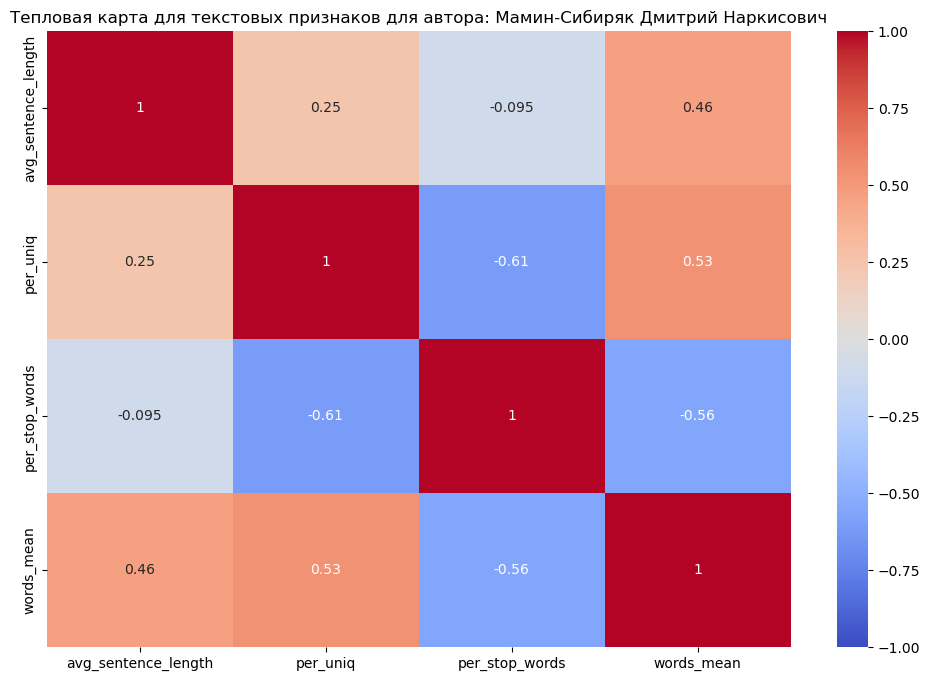

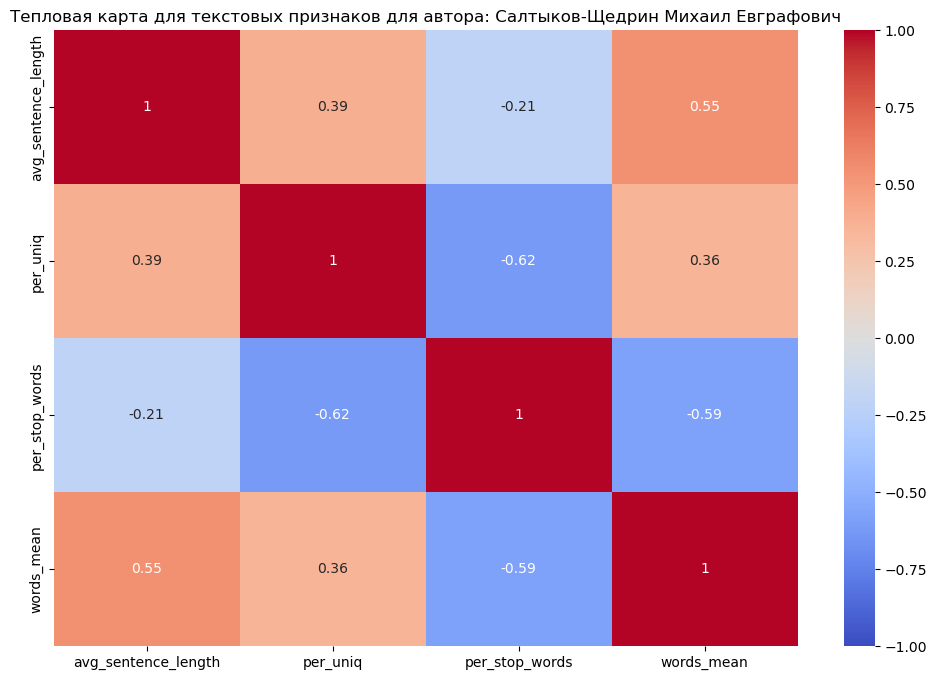

...

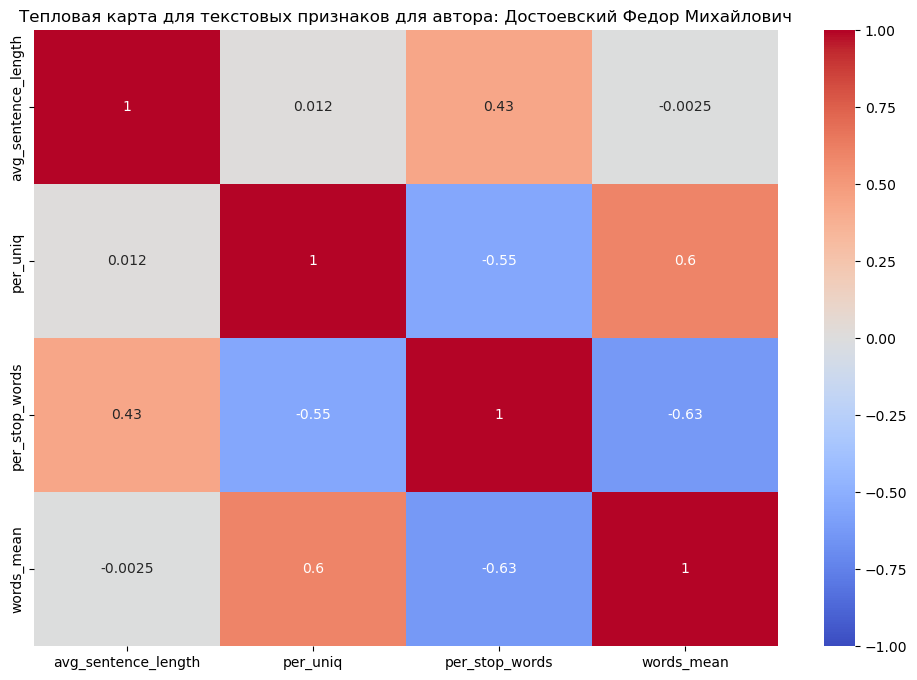

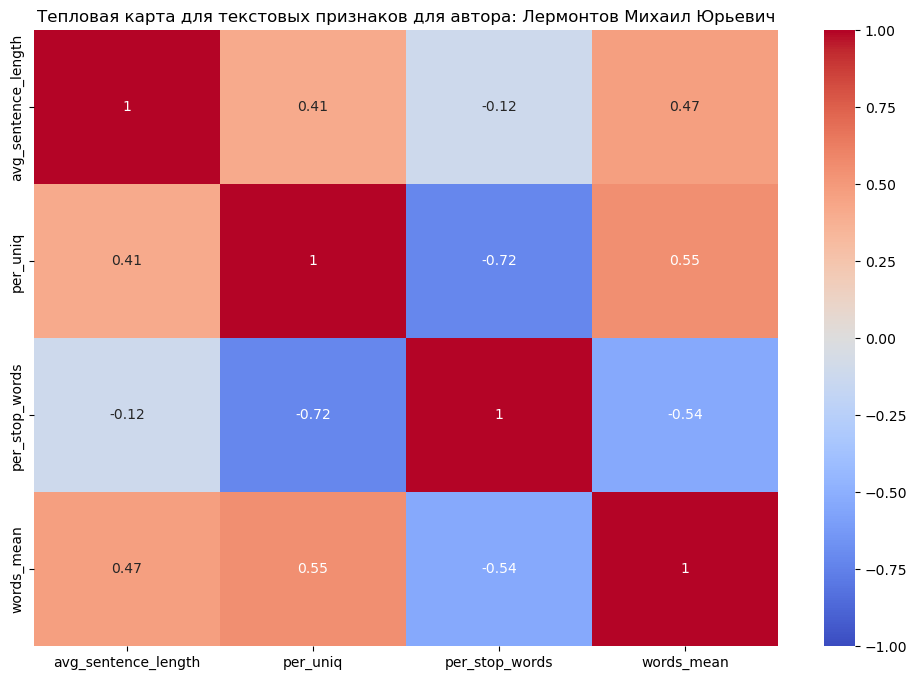

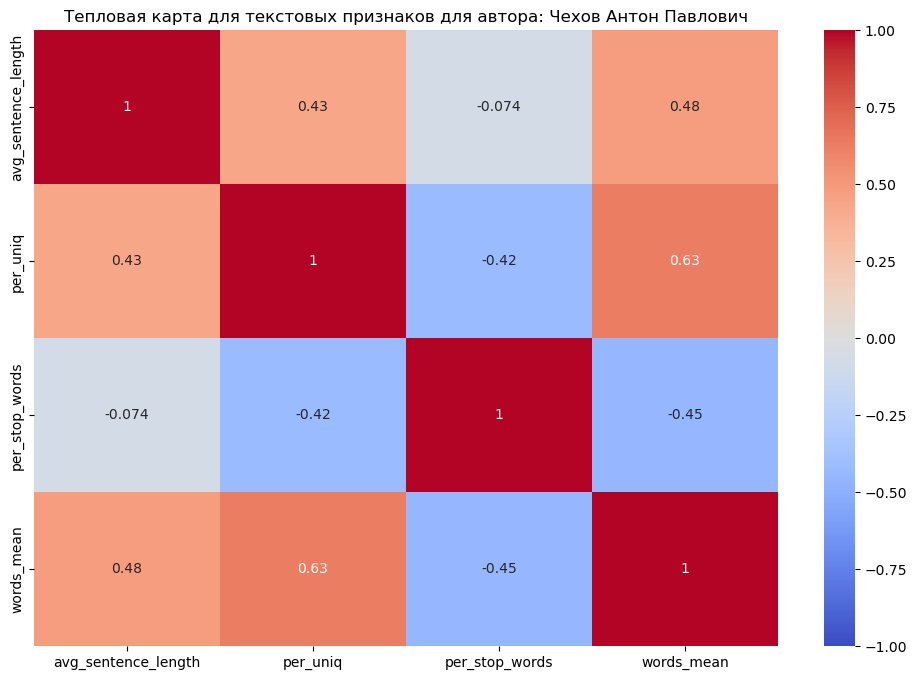

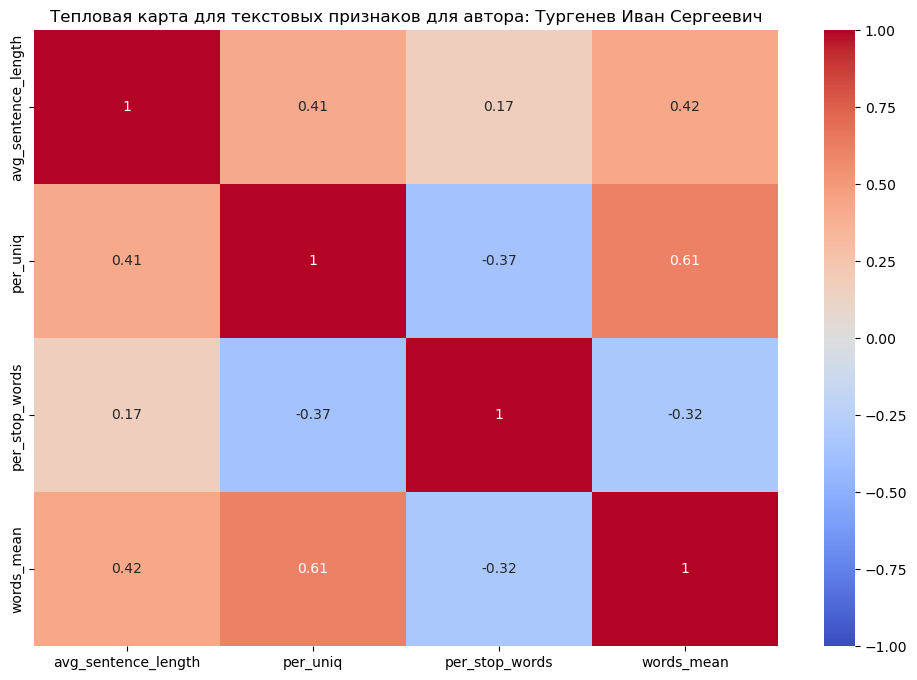

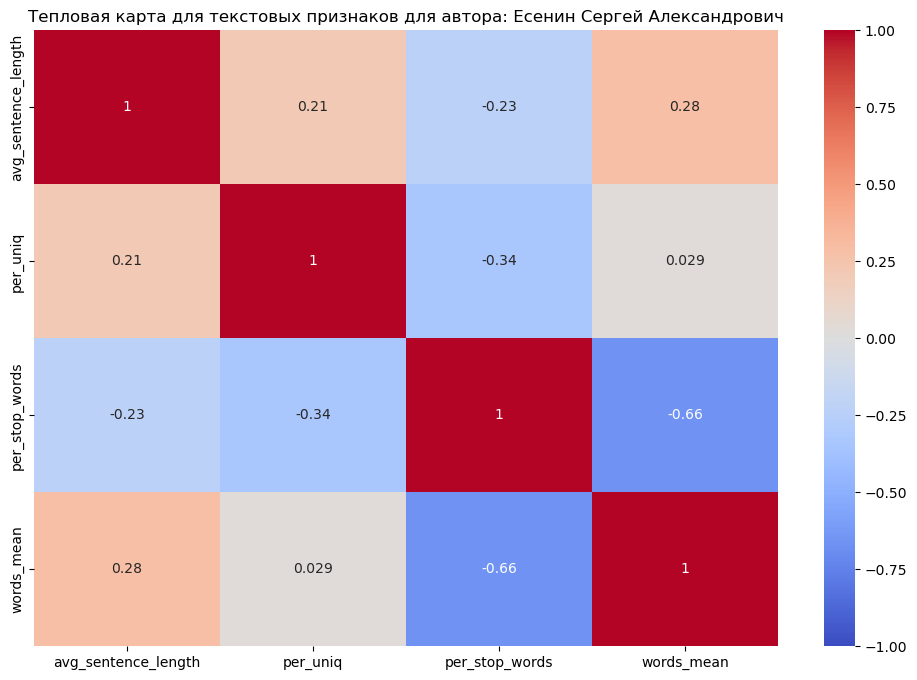

In [166]:
text_features = ['avg_sentence_length', 'per_uniq', 'per_stop_words', 'words_mean']
# список авторов
authors = df['author'].unique()

# построение карты корреляции для каждого автора
for author in authors:
    author_data = df[df['author'] == author]
    correlation_matrix = author_data[text_features].corr()
    
    # Визуализация
    plt.figure(figsize=(12, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title(f"Тепловая карта для текстовых признаков для автора: {author}")
    plt.show()

### 4.2. Word Clouds

In [167]:
def merge_counters(counters):
    total_counter = Counter()
    for counter in counters:
        total_counter.update(counter)
    return total_counter

In [171]:
grouped = df_with_stat.groupby('author').agg({
    'word_counts': lambda x: merge_counters(x),
    'bigrams_counter': lambda x: merge_counters(x),
    'trigrams_counter': lambda x: merge_counters(x)
}).reset_index()

In [203]:
from wordcloud import WordCloud
# Рисование WordCloud для трех сагрегированных колонок
def plot_word_cloud(counter, title):
    if not isinstance(counter, dict) or not counter:
        print(f"No data available for {title}.")
        return
    
    # Преобразуем биграммы и триграммы в формат, который WordCloud может использовать
    new_counter = {}
    for k, v in counter.items():
        if isinstance(k, tuple):
            if len(k) == 2:  # Биграммы
                new_key = f"{k[0]} {k[1]}"
            elif len(k) == 3:  # Триграммы
                new_key = f"{k[0]} {k[1]} {k[2]}"
            else:
                continue  # Пропускаем ключи с некорректной длиной
            new_counter[new_key] = v
        else:
            new_counter[k] = v  # Если ключ - строка, оставляем как есть

    wordcloud = WordCloud(width=800, height=400, background_color='gray', colormap='Set2').generate_from_frequencies(new_counter)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

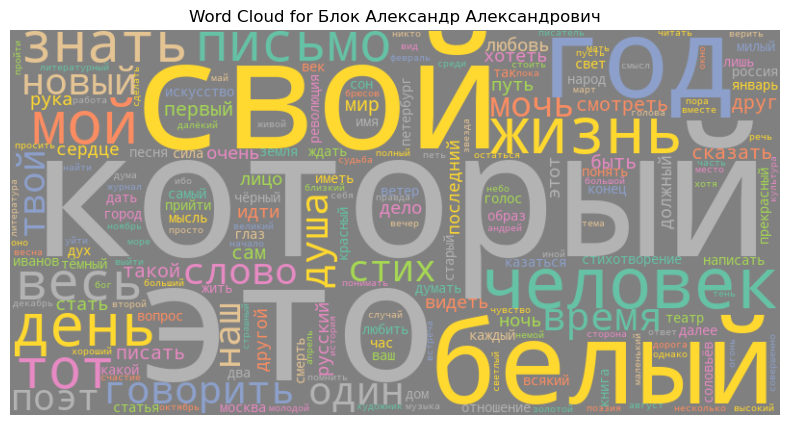

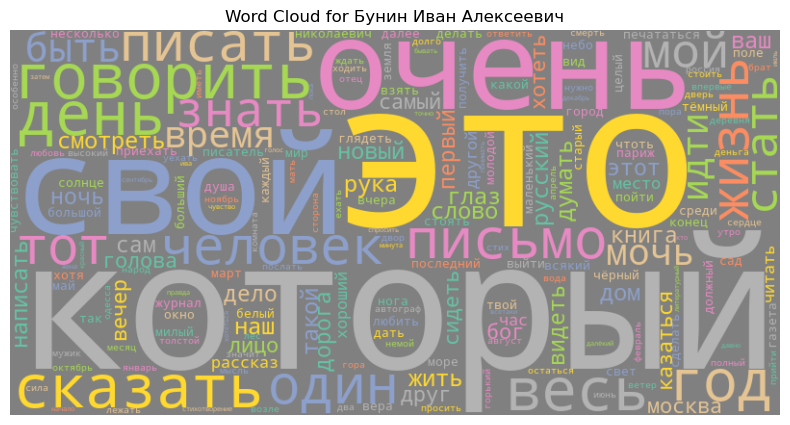

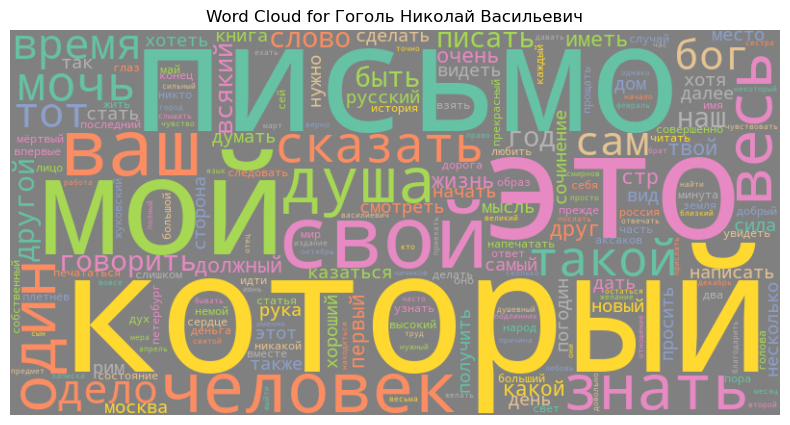

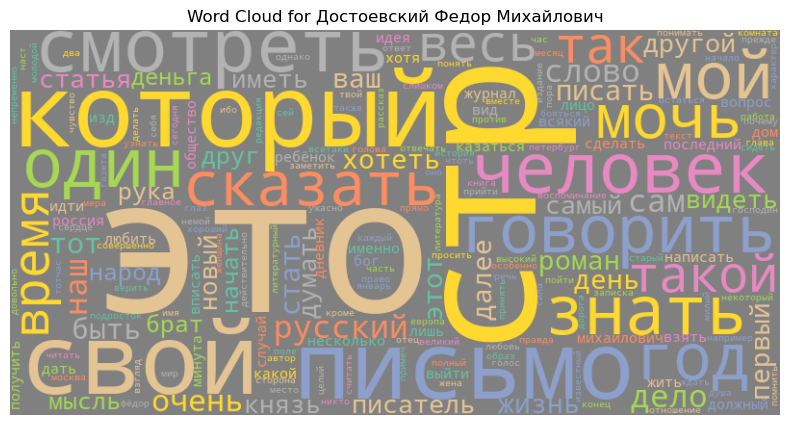

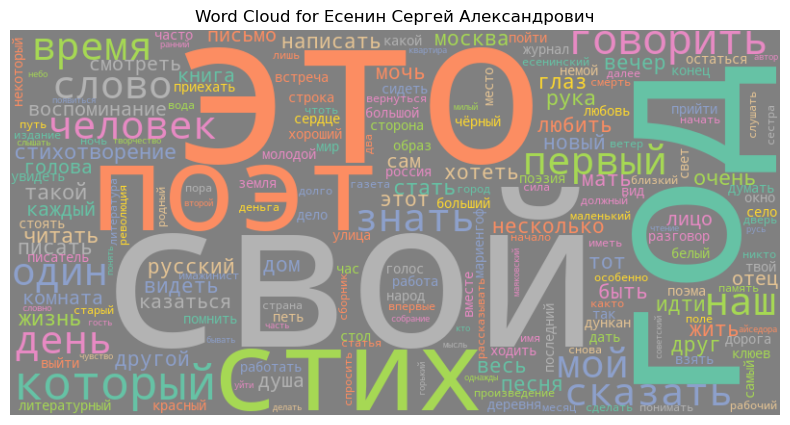

...

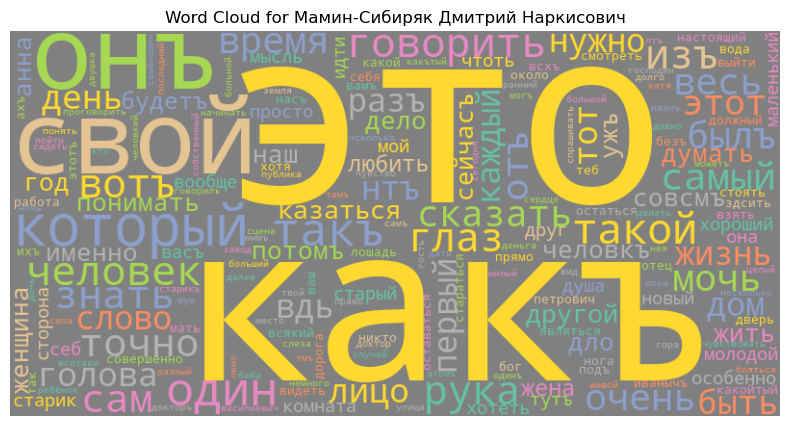

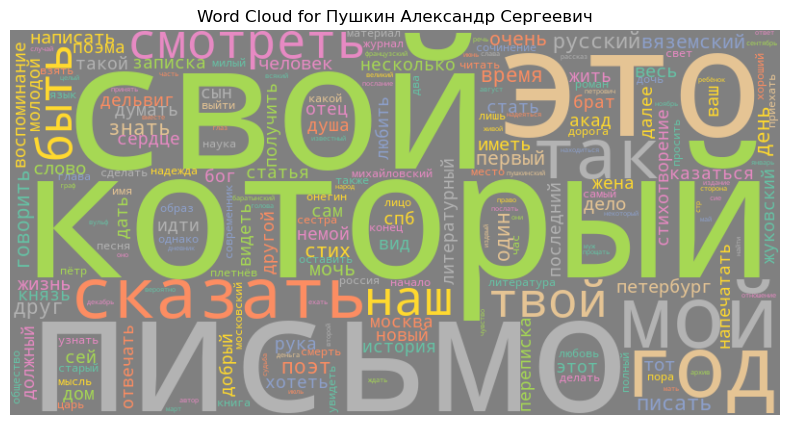

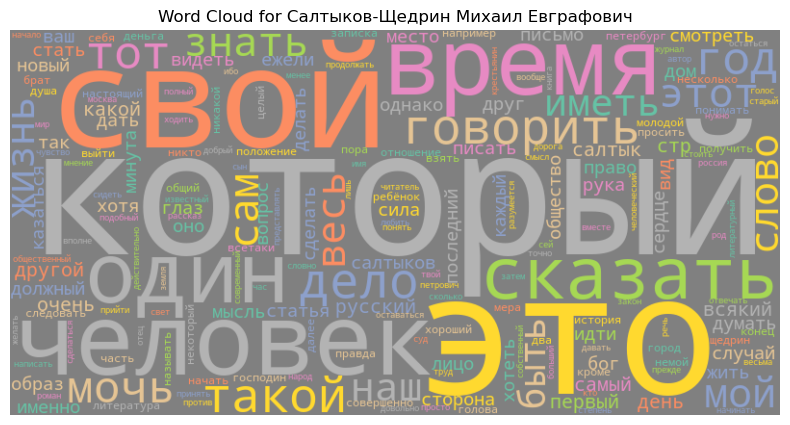

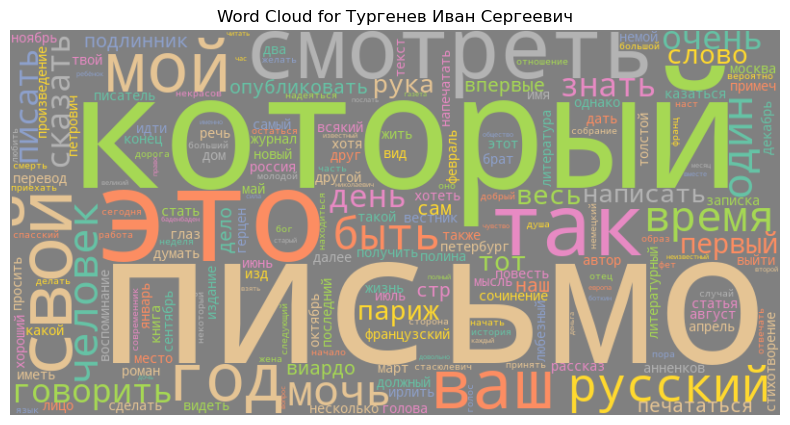

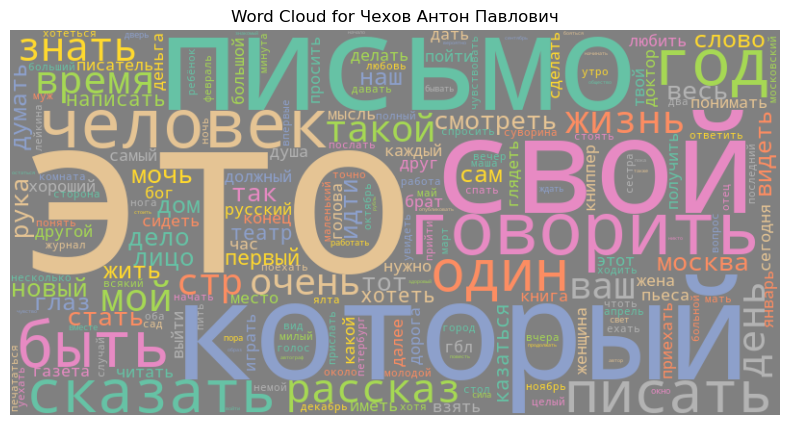

In [204]:
# облака слов для каждого автора
for index, row in grouped.iterrows():
    plot_word_cloud(row['word_counts'], f"Word Cloud for {row['author']}")

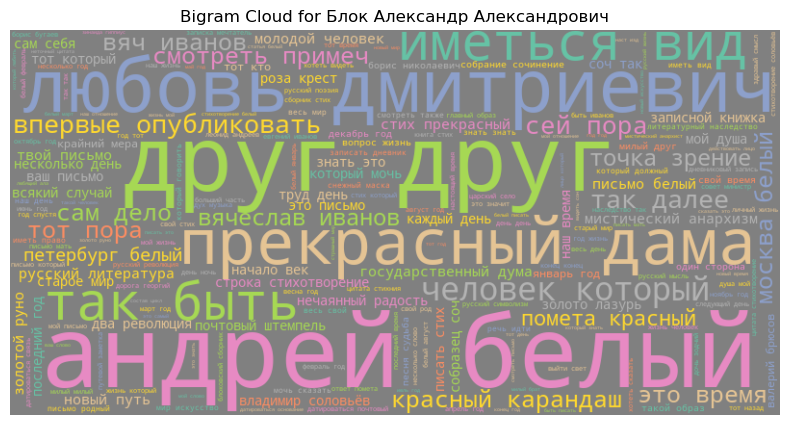

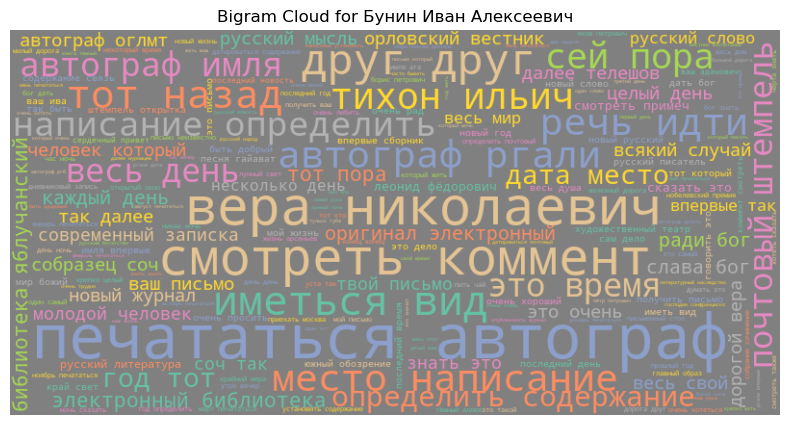

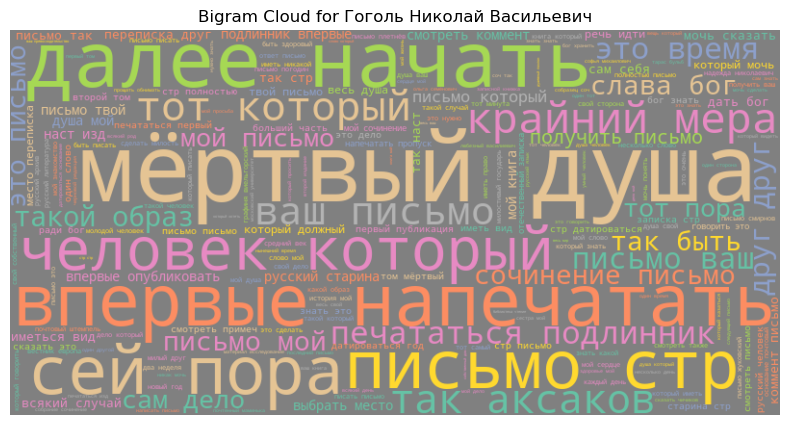

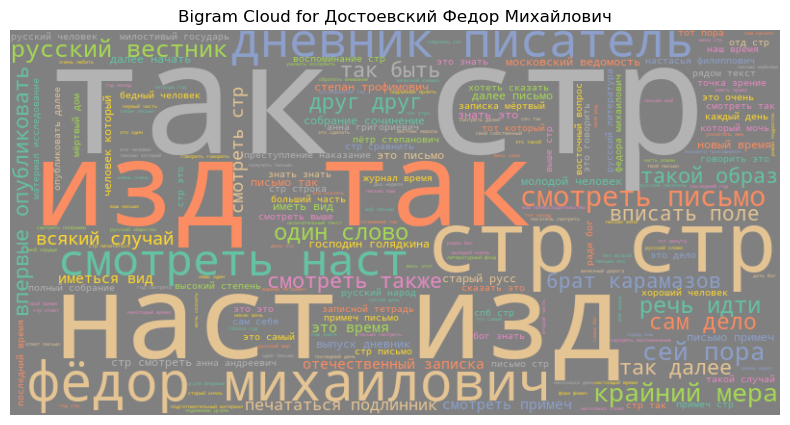

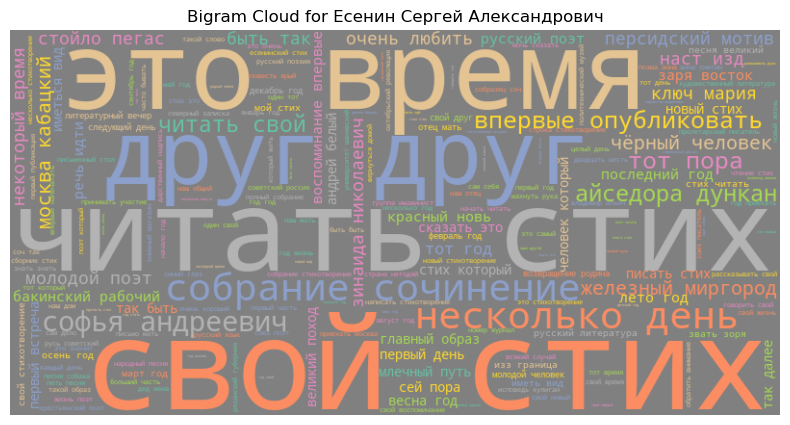

...

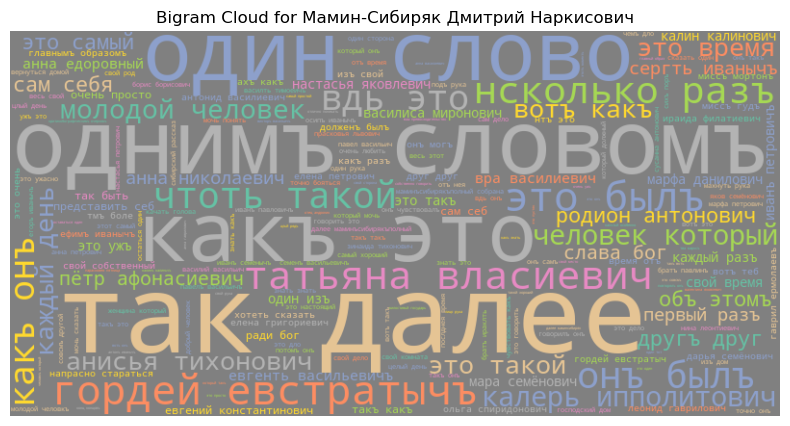

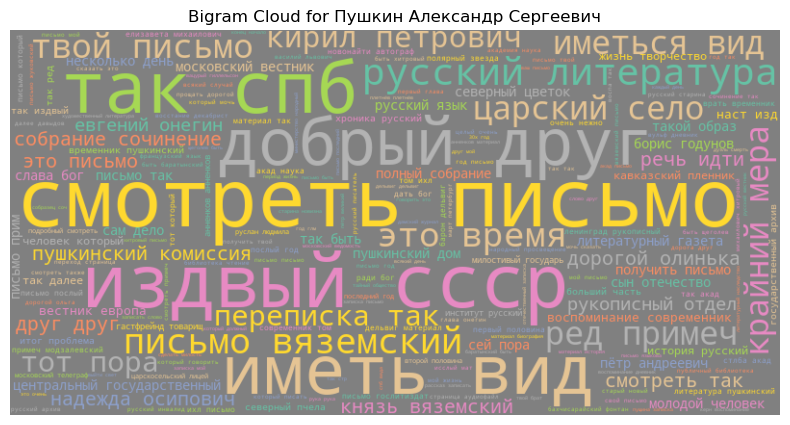

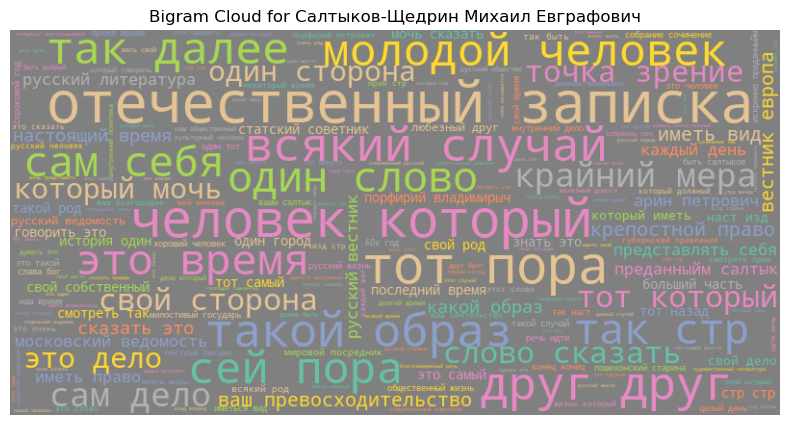

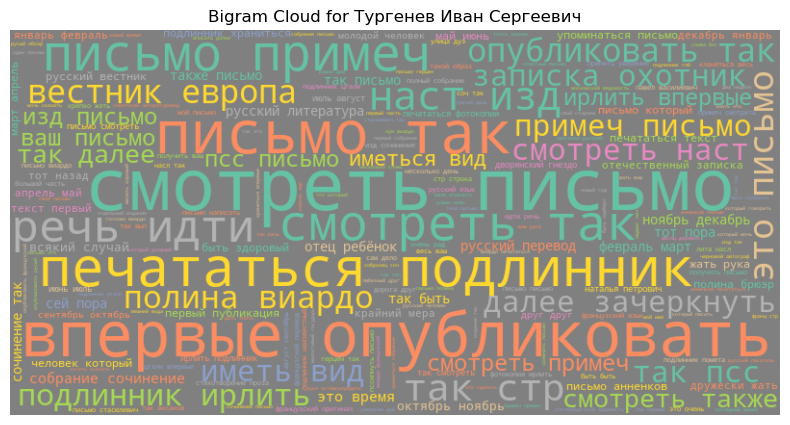

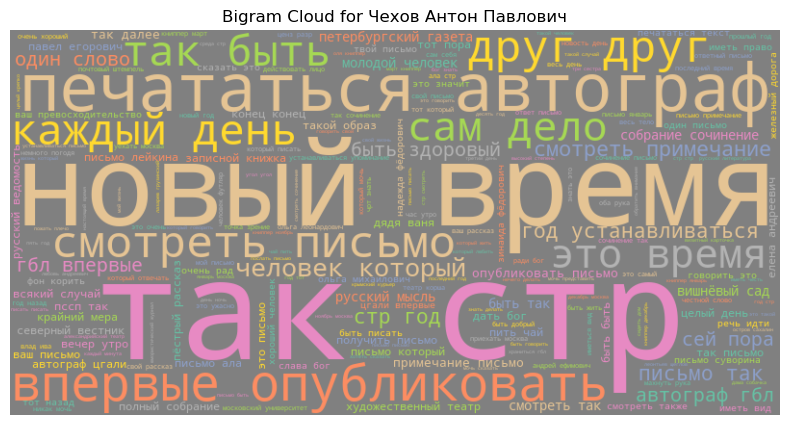

In [205]:
# облака биграм для каждого автора
for index, row in grouped.iterrows():
    plot_word_cloud(row['bigrams_counter'], f"Bigram Cloud for {row['author']}")

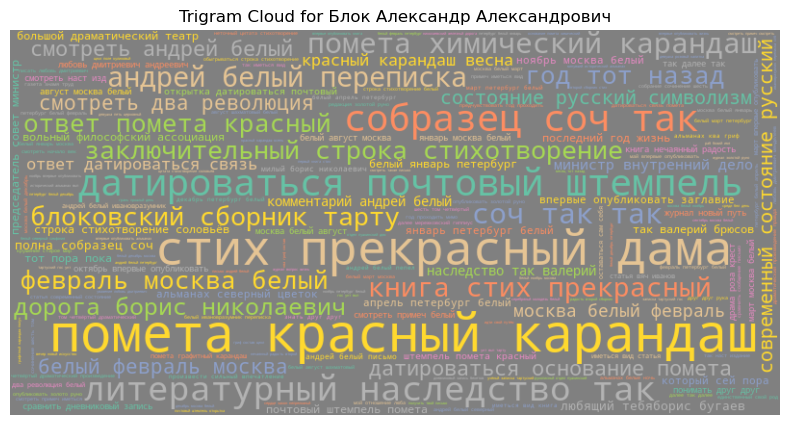

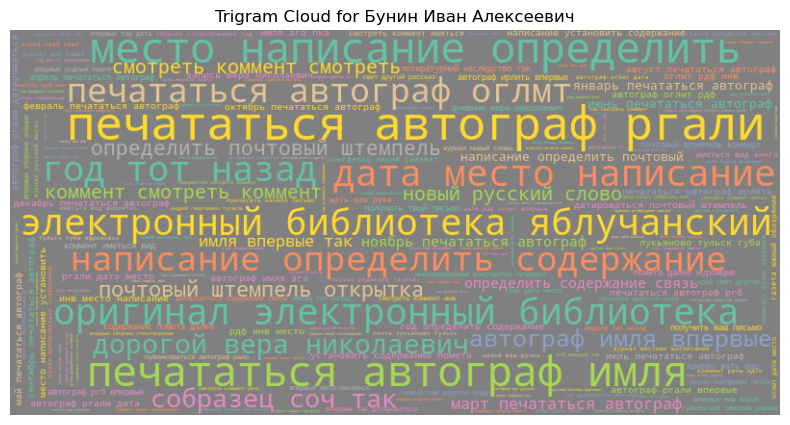

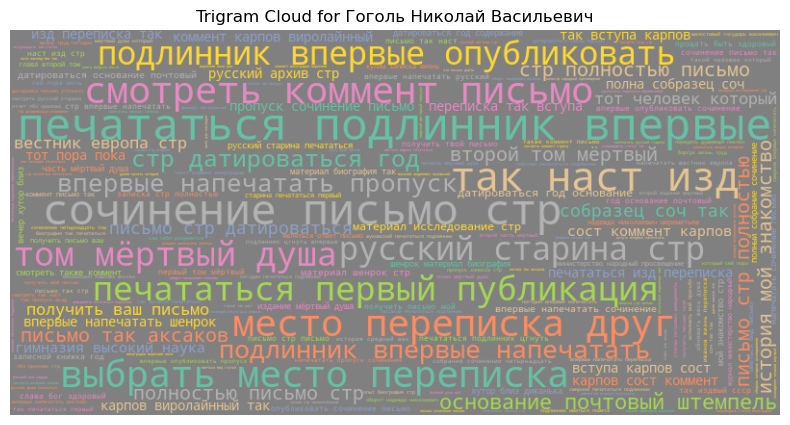

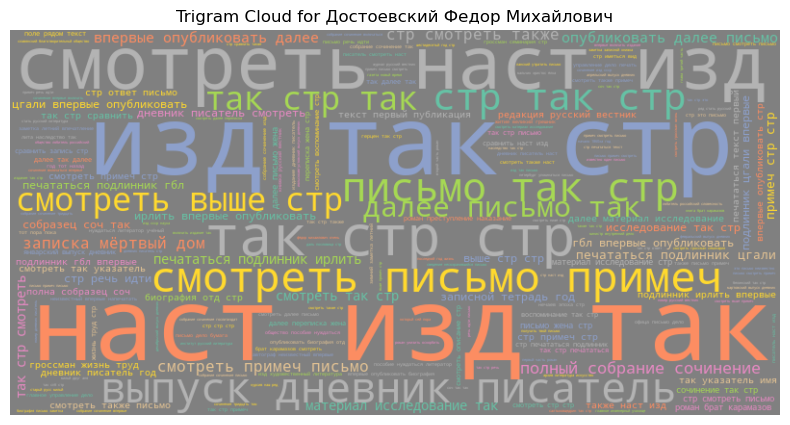

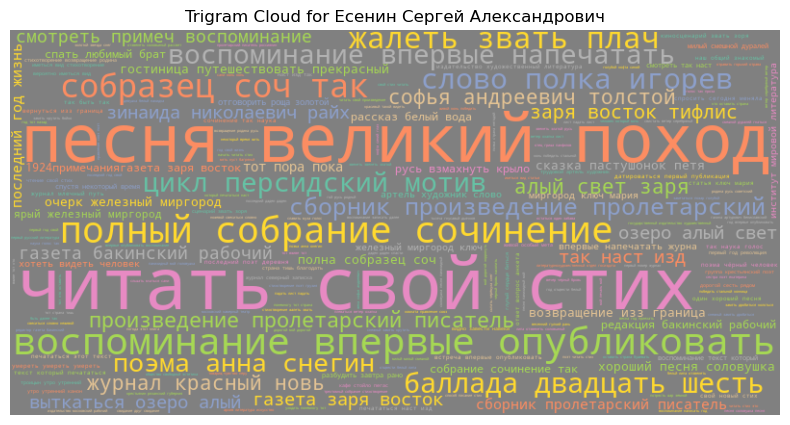

...

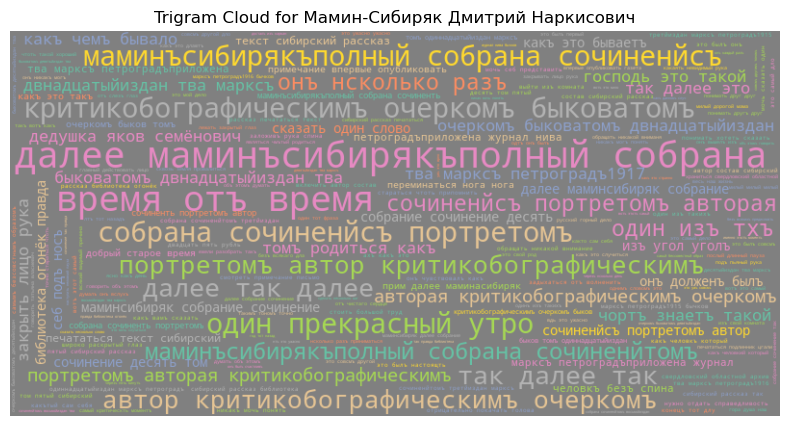

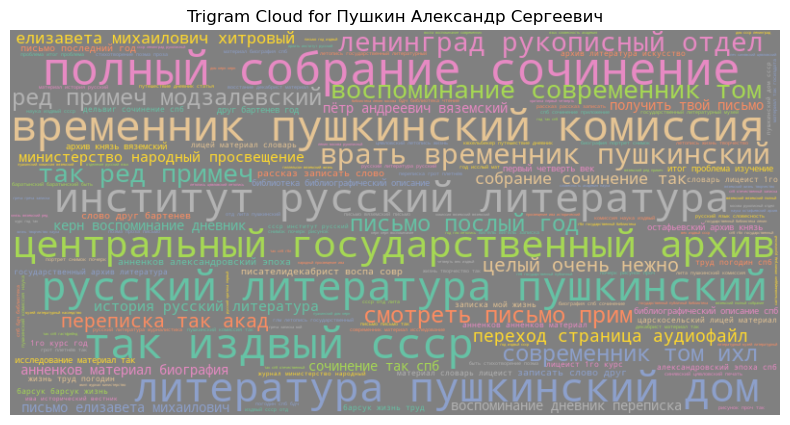

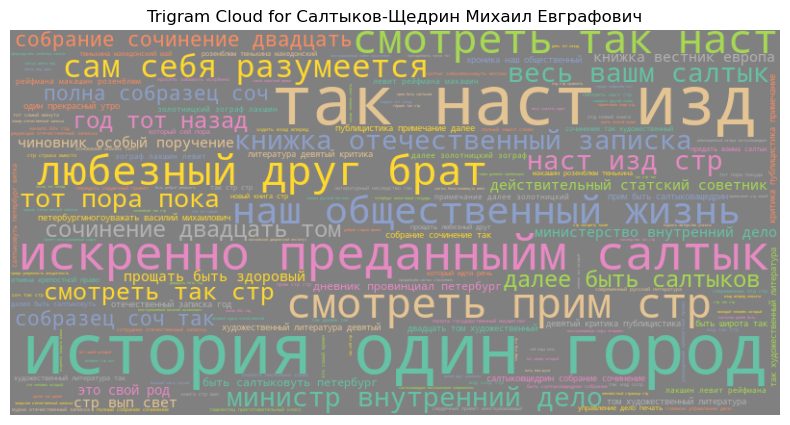

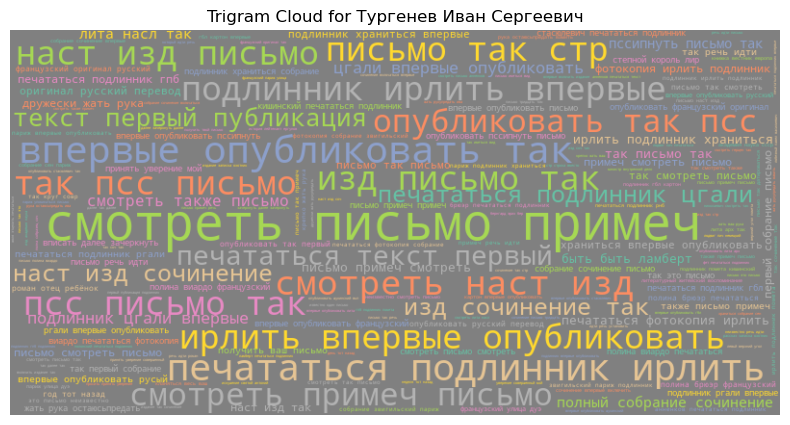

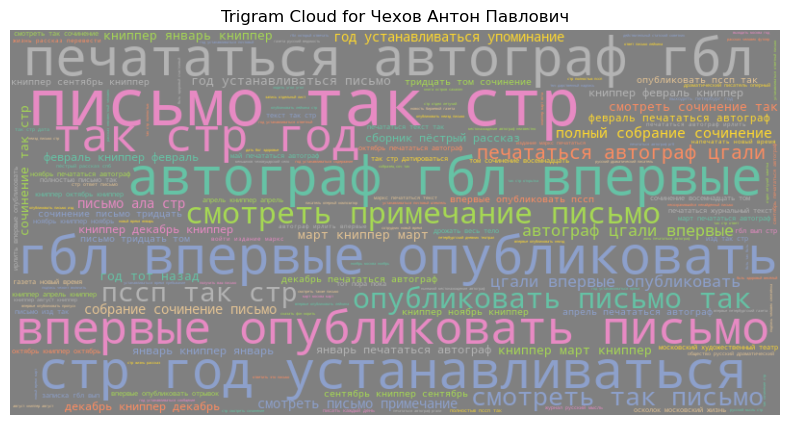

In [206]:
for index, row in grouped.iterrows():
    plot_word_cloud(row['trigrams_counter'], f"Trigram Cloud for {row['author']}")

> Визуализация Word Clouds по авторам показывать довольно хорошую картину пула популярных слов на каждого автора, однако как и в случае с визуализацией распределения популярных (часто используемых) слов, биграмм, триграмм у каждого автора, можно наблюдать некоторые косяки в данных, которые отображают некоторые пометки издательств как самые популярные слова у автора, опуская другие популярные слова из оригинального текста автора. Это говорит нам о том, что необходимо проделать более глубокую очистку текста, если мы хотим получить качественные облака слов на каждого автора.